# Comparing Ante-hoc and Post-hoc Interpretability Methods: SENN, LIME, and Integrated Gradients on CIFAR-10

## Table of Contents

1. [Environment Setup](#setup)
2. [SENN Training](#training)
3. [SENN loading](#loading)
4. [SENN Explanations](#sennexp)
5. [LIME Explanations](#limeexp)
6. [IG Explanations](#igexp)
___

<a name="setup"></a>
# 1. Environment Setup

## Installing required libraries

(Note: After installing these dependencies you are required to restart the session to use the correct versions)

In [1]:
!pip install matplotlib==3.5
!pip install "numpy<2.0.0"

In [2]:
!pip install lime
!pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=66c7d5aef92c3f106de47c25588a8b3408e9d438046db4cccff3c1bb255660ef
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 26.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 77.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 60.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Setting up repo

In [3]:
!git clone https://github.com/mattia-rampazzo/SENN

Cloning into 'SENN'...
remote: Enumerating objects: 1751, done.
remote: Counting objects: 100% (320/320), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 1751 (delta 302), reused 298 (delta 298), pack-reused 1431 (from 2)
Receiving objects: 100% (1751/1751), 69.91 MiB | 20.03 MiB/s, done.
Resolving deltas: 100% (1007/1007), done.
Updating files: 100% (139/139), done.


In [4]:
%cd SENN

/content/SENN


## Import libraries

In [5]:
import json
import torch
import random
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
from torchvision.utils import make_grid
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from pathlib import Path
from types import SimpleNamespace
from importlib import import_module
from tqdm import tqdm


%matplotlib inline

In [6]:
from senn.models.losses import *
from senn.models.parameterizers import *
from senn.models.conceptizers import *
from senn.models.aggregators import *
from senn.models.senn import SENN

In [7]:
from senn.datasets.dataloaders import get_dataloader
from senn.utils.plot_utils import show_explainations, show_prototypes, plot_lambda_accuracy, get_comparison_plot

## Utility functions

In [8]:
def get_config(filename):
    config_path = Path('configs')
    config_file = config_path / filename
    with open(config_file, 'r') as f:
        config = json.load(f)

    return SimpleNamespace(**config)

In [9]:
def load_checkpoint(config):
    model_file = Path('results') / config.exp_name / "checkpoints" / "best_model.pt"
    return torch.load(model_file, config.device, weights_only=False)

In [10]:
def accuracy(model, dataloader, config):
    accuracies = []
    model.eval()
    with torch.no_grad():
        for i, (x, labels) in enumerate(dataloader):
            x = x.float().to(config.device)
            labels = labels.long().to(config.device)
            y_pred, (concepts, relevances), _ = model(x)
            accuracies.append((y_pred.argmax(axis=1) == labels).float().mean().item())
    accuracy = np.array(accuracies).mean()
    print(f"Test Mean Accuracy: {accuracy * 100: .3f} %")

In [11]:
class SENNWrapper(torch.nn.Module):
    def __init__(self, senn_model):
        super(SENNWrapper, self).__init__()
        self.senn_model = senn_model

    def forward(self, x):
        # Extract only predictions from the SENN model's output
        predictions, _, _ = self.senn_model(x)
        return predictions  # Return only predictions

In [12]:
def unnormalize(img):
  # Define the mean and std used for normalization
  mean = torch.tensor([0.4914, 0.4822, 0.4465]).view(3, 1, 1).to(img.device)
  std = torch.tensor([0.2470, 0.2435, 0.2616]).view(3, 1, 1).to(img.device)

  # Unnormalize the image: inverse of (x - mean) / std is x * std + mean
  img = img * std + mean # Apply unnormalization
  return img


  #plt.imshow(np.transpose(npimg, (1, 2, 0))) # Transpose from (C, H, W) to (H, W, C) for matplotlib
  #plt.show()

In [13]:
def get_selected_examples():
  # Reproducibility
  torch.manual_seed(10)
  np.random.seed(10)
  random.seed(10)

  dataset = test_dl.dataset
  total_samples = len(dataset)

  # Find one example per class (0-9)
  class_indices = {i: None for i in range(10)}
  selected = []
  for idx in torch.randperm(total_samples).tolist():
      img, label = dataset[idx]
      if class_indices[label] is None:
          class_indices[label] = idx
          selected.append((idx, label))
      if len(selected) == 10:
          break

  selected.sort(key=lambda x: x[1])  # sort by label
  indices = [idx for idx, _ in selected]

  # Load selected samples
  images = torch.stack([dataset[idx][0] for idx in indices]).float().to(device)

  return images

In [14]:
def get_subsample():

  # Reproducibility
  torch.manual_seed(10)
  np.random.seed(10)
  random.seed(10)

  dataset = test_dl.dataset

  # Generate 100 unique random indices
  num_images_total = len(dataset)
  num_images_to_sample = 100
  random_indices = random.sample(range(num_images_total), num_images_to_sample)

  # Create the subset using the random indices
  subsampled_test_set = torch.utils.data.Subset(dataset, random_indices)


  examples = [subsampled_test_set[i][0] for i in range(len(subsampled_test_set))]
  true_labels = [subsampled_test_set[i][1] for i in range(len(subsampled_test_set))]

  return examples, true_labels

## Configuration

In [15]:
plt.style.use('seaborn-notebook')

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

<a name="training"></a>
# 2. SENN Training

In [ ]:
!python main.py --config configs/cifar10_lambda1e-4_seed123.json

2025-06-05 16:23:48.694833: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749140628.714969   39045 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749140628.721179   39045 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
 EXPERIMENT: cifar10_lambda1e-4_seed123
{'aggregator': 'SumAggregator',
 'batch_size': 128,
 'concept_dim': 1,
 'concept_reg': 1,
 'conceptizer': 'Cifar10Conceptizer',
 'data_path': 'datasets/data/cifar10',
 'dataloader': 'cifar10',
 'device': 'cuda',
 'dropout': 0.5,
 'epochs': 10,
 'eval_freq': 100,
 'exp_name': 'cifar10_lambda1e-4_seed123',
 'image_channels': 3,
 'image_size': 32,
 'lr': 0.0002,
 'manual_seed': 123,
 'num_classes'

<a name="loading"></a>
# 3. Loading SENN model and test set

## Load CIFAR10 Data and Config

In [17]:
cifar10_config = get_config("cifar10_lambda1e-4_seed123.json")
cifar10_config.device = "cpu"

In [18]:
_, _, test_dl = get_dataloader(cifar10_config)

100%|██████████| 170M/170M [00:05<00:00, 29.3MB/s]


## Load Trained Model

In [19]:
conceptizer = Cifar10Conceptizer(din=32*32, nconcept=5, cdim=1, nchannel =3)
parameterizer = Cifar10Parameterizer(din=32*32, nconcept=5, dout=10, arch = 'vgg8', nchannel = 3, only_positive = False)
aggregator = SumAggregator(**cifar10_config.__dict__)

cifar10_SENN = SENN(conceptizer, parameterizer, aggregator)

In [20]:
cifar10_checkpoint = load_checkpoint(cifar10_config)
cifar10_SENN.load_state_dict(cifar10_checkpoint['model_state'])

<All keys matched successfully>

## Test Accuracy

After loading the model, we assess its prediction accuracy on the test set. As you can see, it closely matches the results reported by the original authors.



In [21]:
accuracy(cifar10_SENN, test_dl, cifar10_config)

Test Mean Accuracy:  76.202 %


<a name="sennexp"></a>
# 4. SENN Explanations

## Intelligibility

In [49]:
def create_barplot(ax, relevances, y_pred, x_lim=1.1, title='', x_label='', concept_names=None, **kwargs):
    """Creates a bar plot of relevances.

    Parameters
    ----------
    ax : pyplot axes object
        The axes on which the bar plot should be created.
    relevances: torch.tensor
        The relevances for which the bar plot should be generated. shape: (1, NUM_CONCEPTS, NUM_CLASSES)
    y_pred: torch.tensor (int)
        The prediction of the model for the corresponding relevances. shape: scalar value
    x_lim: float
        the limits of the plot
    title: str
        the title of the plot
    x_label: str
        the label of the X-axis of the plot
    concept_names: list[str]
        the names of each feature on the plot
    """
    # Example data
    y_pred = y_pred.item()
    if len(relevances.squeeze().size()) == 2:
        relevances = relevances[:, y_pred]
    relevances = relevances.squeeze()
    if concept_names is None:
        concept_names = ['C. {}'.format(i + 1) for i in range(len(relevances))]
    else:
        concept_names = concept_names.copy()
    concept_names.reverse()
    y_pos = np.arange(len(concept_names))
    colors = ['b' if r > 0 else 'r' for r in relevances]
    colors.reverse()

    ax.barh(y_pos, np.flip(relevances.detach().cpu().numpy()), align='center', color=colors)
    ax.set_yticks(y_pos)
    ax.set_yticklabels(concept_names)
    ax.set_xlim(-x_lim, x_lim)
    ax.set_xlabel(x_label, fontsize=18)
    ax.set_title(title, fontsize=18)



In [54]:
def show_explainations(model, test_loader, dataset, num_explanations=2, save_path=None, batch_size=128, concept_names=None,
                       **kwargs):
    """Generates some explanations of model predictions.

    Parameters
    ----------
    model : torch nn.Module
        model to visualize
    test_loader: Dataloader objectkwargs
        Test set dataloader to iterate over test set.
    dataset : str
        Name of the dataset used.
    save_path : str
        Directory where the figures are saved. If None a figure is showed instead.
    batch_size : int
        batch_size of test loader
    """
    # device = 'cuda:0' if next(model.parameters()).is_cuda else 'cpu'
    # model = model.to(device)  # Ensure model is on the correct device
    # model.eval()

    # Determine device and move model to it
    device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

    # Check model device before moving
    # model_device_before = next(model.parameters()).device
    # print(f"Model device before .to(): {model_device_before}")

    model = model.to(device)  # Ensure model is on the correct device
    model.eval()

    # Check model device after moving
    # model_device_after = next(model.parameters()).device
    # print(f"Model device after .to(): {model_device_after}")


    # select test example
    (test_batch, test_labels) = next(iter(test_loader))
    test_batch = test_batch.float().to(device)

    test_batch = get_selected_examples()

    # feed test batch to model to obtain explanation
    y_pred, (concepts, relevances), _ = model(test_batch)
    if len(y_pred.size()) > 1:
        y_pred = y_pred.argmax(1)

    concepts_min = concepts.min().item()
    concepts_max = concepts.max().item()
    concept_lim = abs(concepts_min) if abs(concepts_min) > abs(concepts_max) else abs(concepts_max)

    plt.style.use('seaborn-paper')
    batch_idx = np.random.randint(0, batch_size - 1, num_explanations)
    for i, _ in enumerate(test_batch):
        if concept_names is not None:
            gridsize = (1, 2)
            fig = plt.figure(figsize=(12, 6))
            ax1 = plt.subplot2grid(gridsize, (0, 0))
            ax2 = plt.subplot2grid(gridsize, (0, 1))

            create_barplot(ax1, relevances[batch_idx[i]], y_pred[batch_idx[i]], x_label='Relevances (theta)',
                           concept_names=concept_names, **kwargs)
            ax1.xaxis.set_label_position('top')
            ax1.tick_params(which='major', labelsize=12)

            create_barplot(ax2, concepts[batch_idx[i]], y_pred[batch_idx[i]], x_lim=concept_lim,
                           x_label='Concepts/Raw Inputs', concept_names=concept_names, **kwargs)
            ax2.xaxis.set_label_position('top')
            ax2.tick_params(which='major', labelsize=12)

        else:
            gridsize = (1, 3)
            fig = plt.figure(figsize=(9, 3))
            ax1 = plt.subplot2grid(gridsize, (0, 0))
            ax2 = plt.subplot2grid(gridsize, (0, 1))
            ax3 = plt.subplot2grid(gridsize, (0, 2))

            rgb_image = unnormalize(test_batch[i])
            rgb_image = rgb_image.detach().cpu().numpy()

            # image should be H,W,C and values in range [0,255]
            rgb_image = np.transpose(rgb_image, (1, 2, 0))
            rgb_image = (rgb_image * 255.0).astype(np.uint8)


            ax1.imshow(rgb_image)
            ax1.set_axis_off()
            ax1.set_title(f'Input Prediction: {y_pred[i].item()}', fontsize=18)

            create_barplot(ax2, relevances[i], y_pred[i], x_label='Relevances (theta)', **kwargs)
            ax2.xaxis.set_label_position('top')
            ax2.tick_params(which='major', labelsize=12)

            create_barplot(ax3, concepts[i], y_pred[i], x_lim=concept_lim,
                           x_label='Concept activations (h)', **kwargs)
            ax3.xaxis.set_label_position('top')
            ax3.tick_params(which='major', labelsize=12)

        plt.tight_layout()

        plt.show() if save_path is None else plt.savefig(path.join(save_path, 'explanation_{}.png'.format(i)))
        plt.close('all')


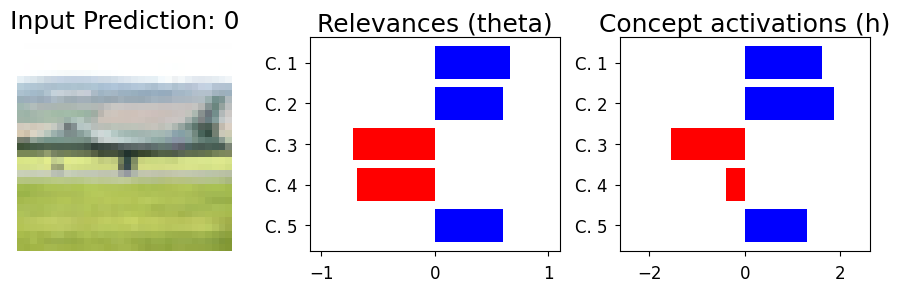

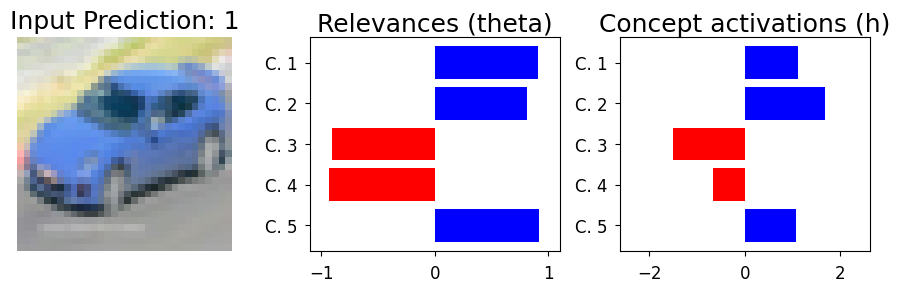

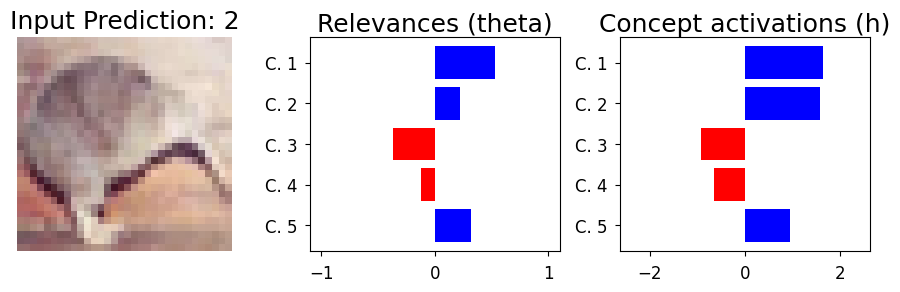

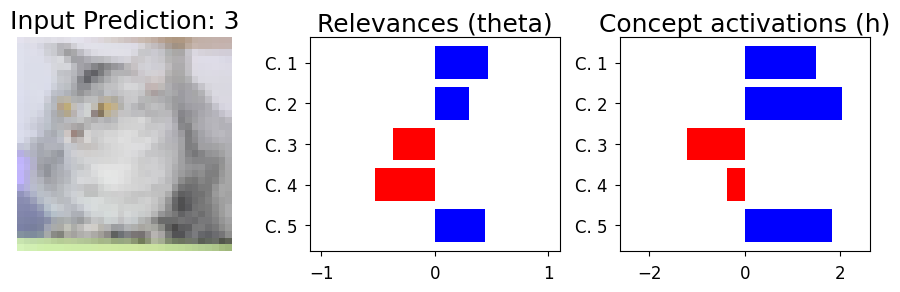

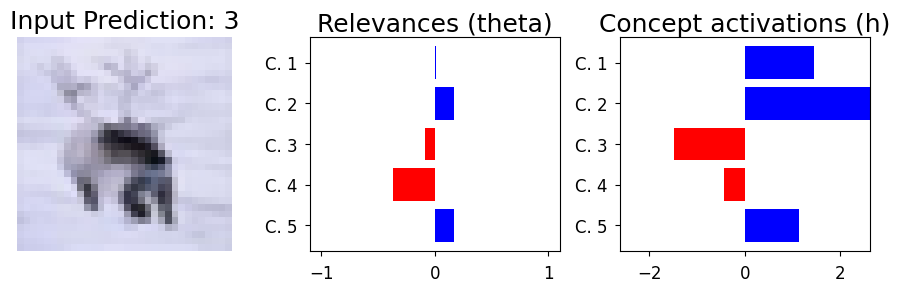

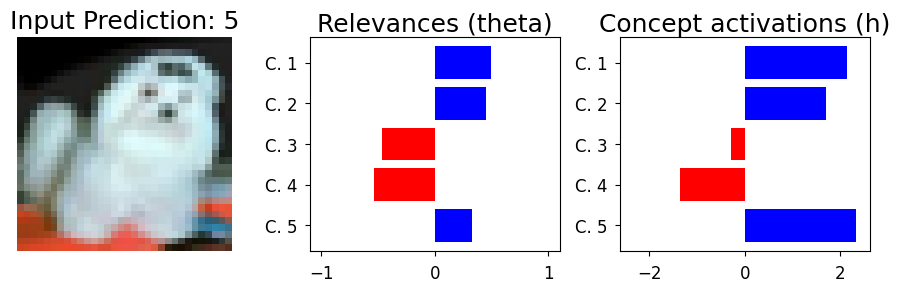

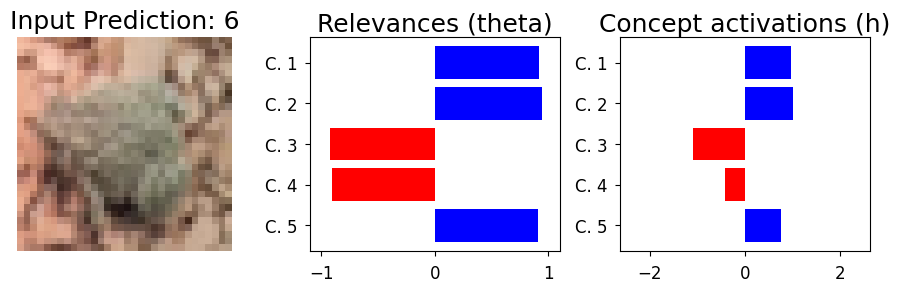

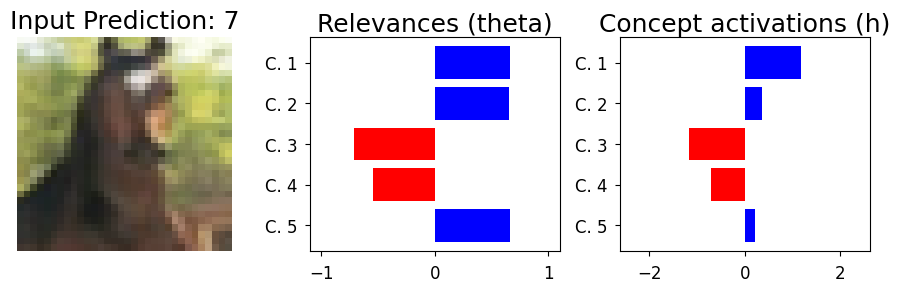

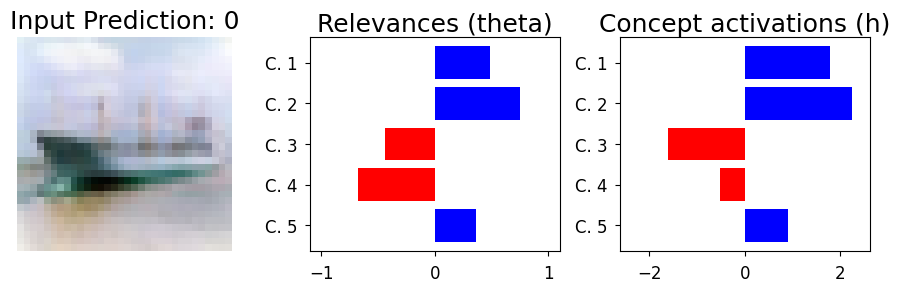

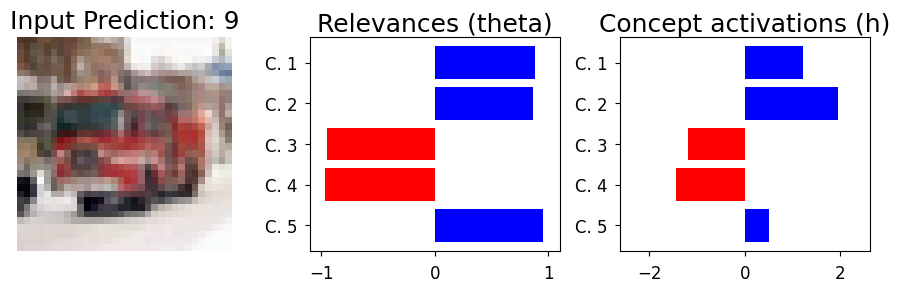

In [55]:
show_explainations(cifar10_SENN, test_dl, 'cifar10')

The following function finds the top nine prototypical test examples that activate a certain concept the most. This visualization method was also used by the authors.

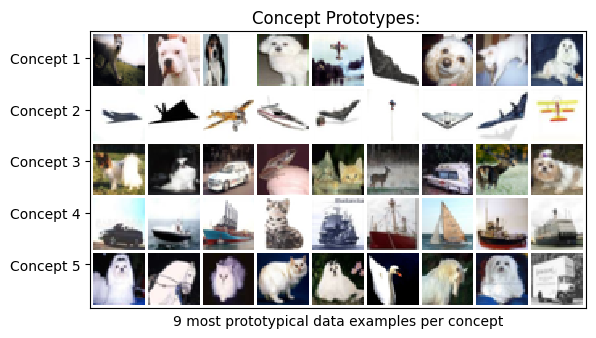

<Figure size 640x480 with 0 Axes>

In [56]:
show_prototypes(cifar10_SENN, test_dl, 'activation')

The following function finds the prototypes with the highest contrast method using the same model as above for highest activation

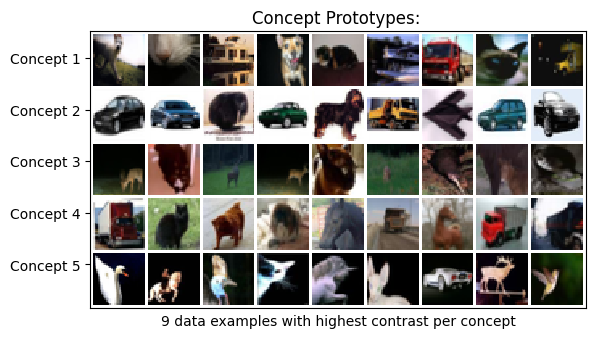

<Figure size 640x480 with 0 Axes>

In [57]:
show_prototypes(cifar10_SENN, test_dl, 'contrast')

## Faithfulness

In [58]:
from scipy.stats import spearmanr, pearsonr
from tqdm import tqdm

In [60]:
def plot_prob_drop(attribs, prob_drop, save_path = None):
  ind = np.arange(len(attribs))
  column_names = [str(j) for j in range(1,6)]

  width = 0.65

  fig, ax1 = plt.subplots(figsize=(8,4))

  color1 = '#377eb8'
  ax1.bar(ind+width+0.35, attribs, 0.45, color=color1)
  ax1.set_ylabel(r'Feature Relevance $\theta(x)_i$',color=color1, fontsize = 14)
  #ax1.set_ylim(-1,1)
  ax1.set_xlabel('Feature')
  ax1.tick_params(axis='y', colors=color1)


  color2 = '#ff7f00'
  ax2 = ax1.twinx()
  ax2.ticklabel_format(style='sci',scilimits=(-2,2),axis = 'y')
  ax2.plot(ind+width+0.35, prob_drop, 'o', linestyle='dashed', color=color2)
  ax2.set_ylabel('Probability Drop', color = color2, fontsize = 14)
  ax2.tick_params(axis='y', colors=color2)


  ax1.set_xticks(ind+width+(width/2))
  ax1.set_xticklabels(column_names)

  fig.tight_layout()
  if save_path:
      plt.savefig(save_path, bbox_inches = 'tight', format='pdf', dpi=300)

  plt.show()

In [61]:
def faithfulness_one_example(model, x, y, device):
  x, y = x.to(device), y.to(device)
  logits, (concepts, relevance), _ = model(x)  # B x 10, B x 5 x 1, B x 5 x 10

  probs = F.softmax(logits, dim=1)
  pred_class = probs.argmax(dim=1)  # B
  pred_scores = probs[torch.arange(x.size(0)), pred_class]  # B


  for j in range(x.size(0)):  # Loop over samples in batch
      h = concepts[j]          # 5 x 1
      theta = relevance[j]     # 5 x 10
      base_score = pred_scores[j].item()
      pred_label = pred_class[j].item()

      delta_scores = []

      # Recompute prediction after removing each concept
      for k in range(len(h)):
          h_mod = h.clone()
          h_mod[k] = 0  # remove concept k

          logits_mod = model.aggregator(h_mod.unsqueeze(0), theta.unsqueeze(0))
          probs_mod = F.softmax(logits_mod, dim=1)
          score_mod = probs_mod[0, pred_label].item()
          # print(k, score_mod)
          delta_scores.append(base_score - score_mod)

      attr = theta[:, pred_label].detach().cpu().numpy()

      print(f"Concept relevances: {attr}")
      print(f"Prob drops: {delta_scores}")


      delta_scores = np.array(delta_scores)
      # theta_abs = theta[:, pred_label].abs().detach().cpu().numpy()
      theta = theta[:, pred_label].detach().cpu().numpy()

      # Compute correlation between relevance and Δ
      if np.std(delta_scores) > 1e-5 and np.std(theta) > 1e-5:
          spearman_corr = spearmanr(delta_scores, theta).correlation
          print(f"Spearman corr: {spearman_corr}")

      plot_prob_drop(attr, delta_scores)

In [62]:
def evaluate_faithfulness(model, test_dl, device='cuda', num_concepts=5):
    model.eval()
    correlations = []

    relevance_all = [[] for _ in range(num_concepts)]
    delta_all = [[] for _ in range(num_concepts)]


    for i, (x, y) in enumerate(tqdm(test_dl)):
        x, y = x.to(device), y.to(device)
        logits, (concepts, relevance), _ = model(x)  # B x 10, B x 5 x 1, B x 5 x 10

        probs = F.softmax(logits, dim=1)
        pred_class = probs.argmax(dim=1)  # B
        pred_scores = probs[torch.arange(x.size(0)), pred_class]  # B

        batch_corr = []

        for j in range(x.size(0)):  # Loop over samples in batch
            h = concepts[j]          # 5 x 1
            theta = relevance[j]     # 5 x 10
            base_score = pred_scores[j].item()
            pred_label = pred_class[j].item()

            # print(base_score)

            delta_scores = []

            # Recompute prediction after removing each concept
            for k in range(len(h)):
                h_mod = h.clone()
                h_mod[k] = 0  # remove concept k

                logits_mod = model.aggregator(h_mod.unsqueeze(0), theta.unsqueeze(0))
                probs_mod = F.softmax(logits_mod, dim=1)
                score_mod = probs_mod[0, pred_label].item()
                # print(k, score_mod)

                delta_scores.append(base_score - score_mod)

            delta_scores = np.array(delta_scores)
            # theta_abs = theta[:, pred_label].abs().detach().cpu().numpy()
            theta = theta[:, pred_label].detach().cpu().numpy()


            # print(delta_scores.shape)
            # print(theta_abs.shape)
            # print(len(theta_abs))


            # Compute correlation between relevance and Δ
            if np.std(delta_scores) > 1e-5 and np.std(theta) > 1e-5:
                spearman_corr = spearmanr(delta_scores, theta).correlation
                batch_corr.append(spearman_corr)

        if batch_corr:
            correlations.extend(batch_corr)

    return correlations

Using device: cuda
Concept relevances: [ 0.66485     0.6021961  -0.71655446 -0.6891074   0.5995009 ]
Prob drops: [0.01555788516998291, 0.02681732177734375, 0.025306284427642822, 0.0025346875190734863, 0.014181077480316162]
Spearman corr: 0.19999999999999998


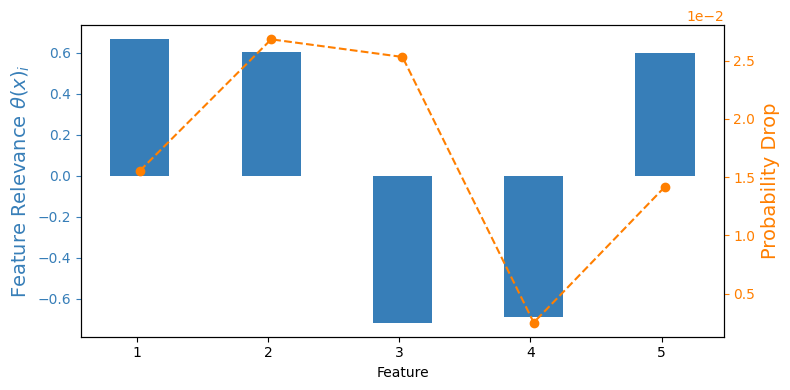

Concept relevances: [ 0.9085412   0.8153929  -0.9044435  -0.9298526   0.91392106]
Prob drops: [0.02498483657836914, 0.03329265117645264, 0.040521085262298584, 0.009833574295043945, 0.02637547254562378]
Spearman corr: 0.09999999999999999


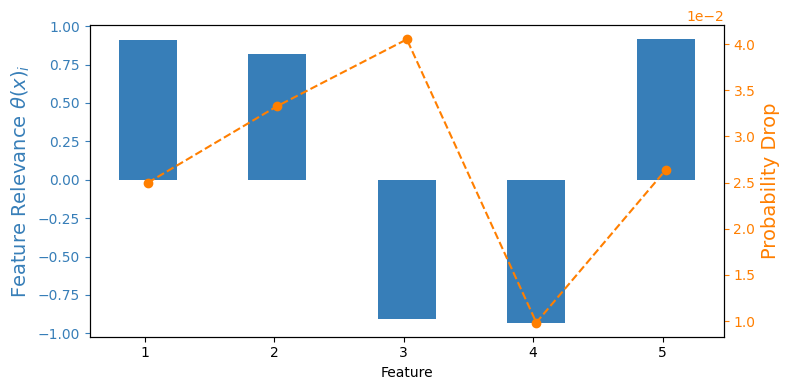

Concept relevances: [ 0.5304419   0.22027701 -0.366092   -0.12140244  0.3181603 ]
Prob drops: [0.232774019241333, 0.09826004505157471, 0.10632365942001343, 0.011200428009033203, 0.09214812517166138]
Spearman corr: 0.3


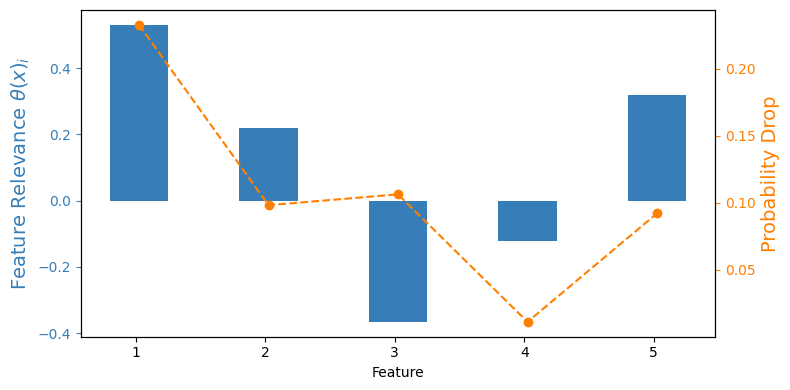

Concept relevances: [ 0.4686368   0.30288023 -0.36707973 -0.5250694   0.44226906]
Prob drops: [0.09451252222061157, 0.07519501447677612, 0.05533480644226074, 0.013370394706726074, 0.15328919887542725]
Spearman corr: 0.8999999999999998


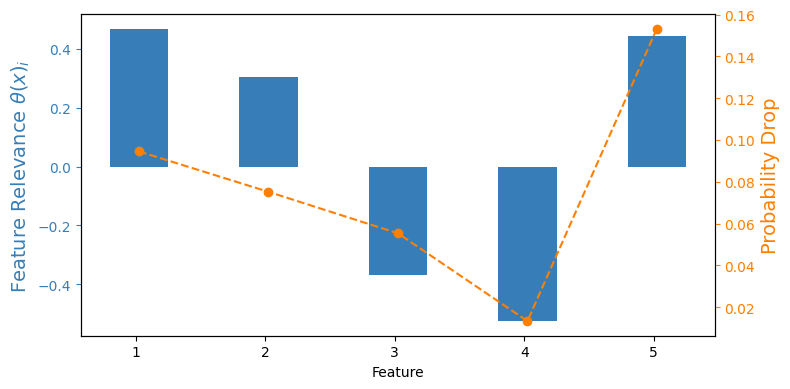

Concept relevances: [ 0.01255206  0.16775505 -0.08325956 -0.36910322  0.16584119]
Prob drops: [0.10207653045654297, 0.28358614444732666, 0.10959112644195557, 0.04705113172531128, 0.09771192073822021]
Spearman corr: 0.6


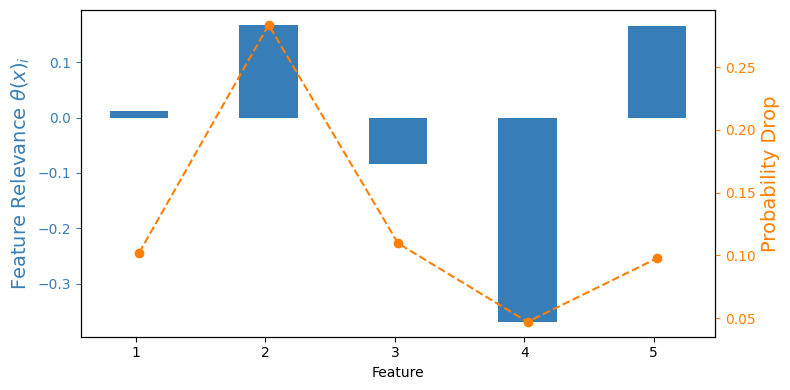

Concept relevances: [ 0.49266642  0.45424917 -0.4661215  -0.53759986  0.32417464]
Prob drops: [0.13731175661087036, 0.06921905279159546, 0.013574779033660889, 0.04995250701904297, 0.05354487895965576]
Spearman corr: 0.8999999999999998


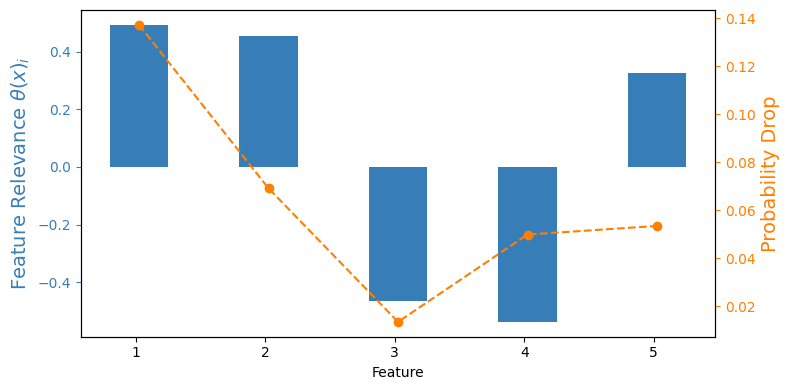

Concept relevances: [ 0.9149611   0.944165   -0.92098963 -0.9076136   0.9107333 ]
Prob drops: [0.026138365268707275, 0.034761786460876465, 0.040071308612823486, 0.008720695972442627, 0.017823398113250732]
Spearman corr: 0.0


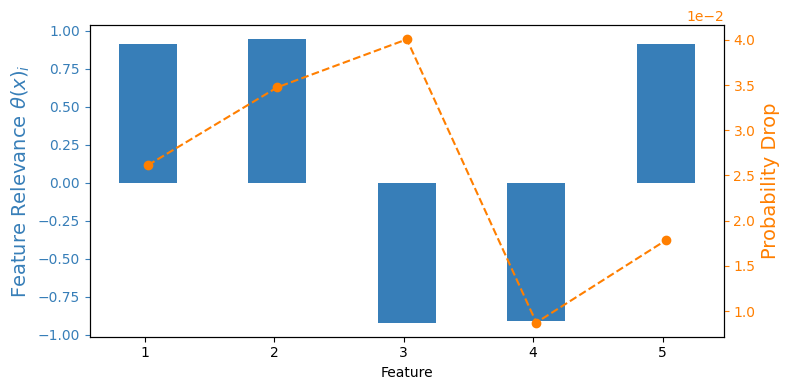

Concept relevances: [ 0.6626879   0.6497434  -0.713796   -0.54252064  0.66005707]
Prob drops: [0.21312862634658813, 0.04357016086578369, 0.24183028936386108, 0.08213835954666138, 0.030636370182037354]
Spearman corr: -0.39999999999999997


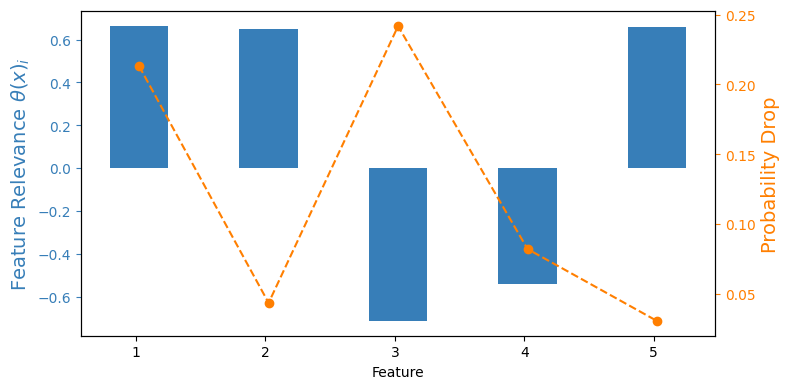

Concept relevances: [ 0.48612514  0.7487871  -0.43979833 -0.6750907   0.36043003]
Prob drops: [-0.012036740779876709, 0.11422267556190491, 0.03703826665878296, 0.024353206157684326, -0.034786999225616455]
Spearman corr: 0.19999999999999998


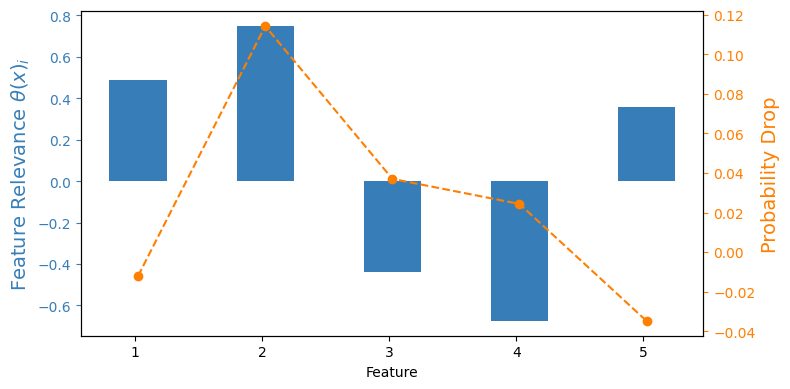

Concept relevances: [ 0.8803301   0.86534894 -0.9494484  -0.962973    0.9526104 ]
Prob drops: [0.002694427967071533, 0.012296676635742188, 0.003142118453979492, 0.0029315948486328125, 0.0006077885627746582]
Spearman corr: -0.6


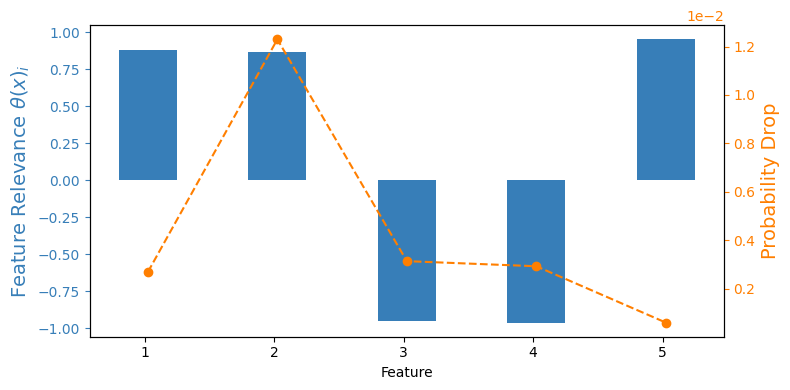

In [63]:
# Need to check if to plot against predicted label or not
examples = get_selected_examples()

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")
cifar10_SENN.to(device)

for i, example in enumerate(examples):

    x = example.unsqueeze(0)
    y = torch.tensor(i)

    # print(y)

    faithfulness_one_example(cifar10_SENN, x, y, device)

In [64]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")
cifar10_SENN.to(device)
correlations = evaluate_faithfulness(cifar10_SENN, test_dl, device)
mean_corr = np.mean(correlations)
std_corr = np.std(correlations)
print(f"Faithfulness (Spearman): {mean_corr:.3f} ± {std_corr:.3f}")

Using device: cuda


100%|██████████| 78/78 [00:23<00:00,  3.35it/s]

Faithfulness (Spearman): 0.139 ± 0.486


## Stability

In [65]:
from torch.autograd import Variable

In [66]:
def plot_dependencies(dictionary_values,
                      pos_color="#ff4d4d",
                      negative_color="#3DE8F7",
                      reverse_values=False,
                      sort_rows =True,
                      scale_values = True,
                      title="",
                      fig_size=(4, 4),
                      ax = None,
                      x = None,
                      digits = 1, prediction_text = None,
                      show_table = False, ax_table = None):
    """ This function was adapted form the fairml python package

        x needed only if show_table = True

        digits: (int) significant digits in table
    """
    # add check to make sure that dependence features are not zeros
    if np.sum(np.array(dictionary_values.values())) == 0.0:
        print("Feature dependence for all attributes equal zero."
              " There is nothing to plot here. ")
        return None

    column_names = list(dictionary_values.keys())
    coefficient_values = list(dictionary_values.values())

    # get maximum
    maximum_value = np.absolute(np.array(coefficient_values)).max()
    if scale_values:
        coefficient_values = ((np.array(coefficient_values) / maximum_value) * 100)

    if sort_rows:
        index_sorted = np.argsort(np.array(coefficient_values))
    else:
        index_sorted = range(len(coefficient_values))[::-1]

    sorted_column_names = list(np.array(column_names)[index_sorted])
    sorted_column_values = list(np.array(coefficient_values)[index_sorted])
    pos = np.arange(len(sorted_column_values)) + 0.7

    # rearrange this at some other point.
    def assign_colors_to_bars(array_values,
                              pos_influence=pos_color,
                              negative_influence=negative_color,
                              reverse=reverse_values):

        # if you want the colors to be reversed for positive
        # and negative influences.
        if reverse:
            pos_influence, negative_influence = (negative_influence,
                                                 pos_influence)

        # could rewrite this as a lambda function
        # but I understand this better
        def map_x(x):
            if x > 0:
                return pos_influence
            else:
                return negative_influence
        bar_colors = list(map(map_x, array_values))
        return bar_colors

    bar_colors = assign_colors_to_bars(coefficient_values, reverse=True)
    bar_colors = list(np.array(bar_colors)[index_sorted])

    #pdb.set_trace()
    if ax is None and not show_table:
        #pdb.set_trace()
        fig, ax = plt.subplots(figsize=fig_size)
    elif ax is None and show_table:
        fig, axes = plt.subplots(1, 2, figsize=fig_size)
        ax_table, ax = axes

    ax.barh(pos, sorted_column_values, align='center', color=bar_colors)
    ax.set_yticks(pos)
    ax.set_yticklabels(sorted_column_names)
    if scale_values:
        ax.set_xlim(-105, 105)
    else:
        pass
        #ax.set_xlim(-1.05, 1.05)
    if title:
        ax.set_title("{}".format(title))

    if show_table and ax_table:
        cell_text = [[('%1.' + str(digits) + 'f') % v] for v in x]
        if prediction_text is None:
            ax_table.axis('off')
        else:
            print('here')
            ax_table.set_xticklabels([])
            ax_table.set_yticklabels([])
            ax_table.set_yticks([])
            ax_table.set_xticks([])
            for side in ['top', 'right', 'bottom', 'left']:
                ax_table.spines[side].set_visible(False)
            ax_table.set_xlabel(prediction_text)

        ax_table.table(cellText=cell_text,
                                  rowLabels=sorted_column_names[::-1],
                                  rowColours=bar_colors[::-1],
                                  colLabels=None,#['Value'],
                                  colWidths=[1],
                                  loc='left', cellLoc = 'right',
                                  bbox=[0.2, 0.025, 0.95, 0.95])
        ax_table.set_title('Input Value')
        return ax, ax_table

    return ax

In [67]:
def plot_theta_stability(model, input, pert_type = 'gauss', noise_level = 0.5,
                         samples = 5, save_path = None):
    """ Test stability of relevance scores theta for perturbations of an input.

        If model is of type 1 (i.e. theta is of dimension nconcepts x nclass), visualizes
        the perturbations of dependencies with respect to predicted class.

        If model is of type 1/3 (theta is a vector of size nconcepts), then there's only
        one dimension of theta to visualize.

        Args:
            model (GSENN): GSENN model.
            inputs (list of tensors): Inputs over which stability will be tested. First one is "base" input.

        Returns:
            stability: scalar.

        Displays plot also.

    """
    def gauss_perturbation(x, scale = 1):
        noise = Variable(scale*torch.randn(x.size()), volatile = True)
        if x.is_cuda:
            noise = noise.cuda()
        return x + noise

    model.eval()

    # Generate perturbations
    inputs = [input]
    for i in range(samples):
        inputs.append(gauss_perturbation(input, scale=noise_level))

    fig, ax = plt.subplots(2,len(inputs),figsize=(2*len(inputs),1.5*3))

    # Map Them
    thetas = []
    dists  = []
    for i,x in enumerate(inputs):
        pred, (concepts, relevances), _ = model(x)
        ax[0,i].imshow(np.transpose(x.data.cpu().numpy().squeeze(), (1,2,0)))#, cmap = 'Greys', interpolation = 'nearest')
        ax[0,i].set_xticks([])
        ax[0,i].set_yticks([])
        if i == 0:
            ax[0,i].set_title('Original'.format(i))
        else:
            ax[0,i].set_title('Perturbation {}'.format(i))



        # theta = model.thetas.data.cpu().numpy().squeeze()
        theta = relevances.detach().cpu().numpy().squeeze()
        if theta.shape[1] > 1:
            # Means this is model 1, scalar h and theta_i vector-sized. Choose which one ti visualize
            klass = pred.data.max(1)[1] # Predicted class
            deps = theta[:,klass].squeeze()
            thetas.append(deps)
        else:
            deps = theta
            thetas.append(deps)
        classes = ['C' + str(i) for i in range(theta.shape[0])]
        d = dict(zip(classes, deps))
        A = plot_dependencies(d, title= 'Dependencies', sort_rows = False, ax = ax[1,i])
        #ax[1,i].locator_params(axis = 'y', nbins=10)

        # max_yticks = 10
        # yloc = plt.MaxNLocator(max_yticks)
        # ax[1,i].yaxis.set_major_locator(yloc)
        #print(thetas[-1])
        if i > 0:
            dists.append(np.linalg.norm(thetas[0] - deps))

    dists = np.array(dists)
    plt.tight_layout()
    #print(dists.max())
    if save_path:
        plt.savefig(save_path, bbox_inches = 'tight', format='pdf', dpi=300)
    #plt.show(block=False)

In [68]:
def noise_stability_plots(model, dataset, cuda, save_path):

    examples = get_selected_examples()

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(f"Using device: {device}")
    cifar10_SENN.to(device)

    for i, example in enumerate(examples):

        x = example.unsqueeze(0)
        y = torch.tensor(i)

        plot_theta_stability(cifar10_SENN, x, y, noise_level = 0.5,
                save_path=save_path + '/noise_stability_{}.pdf'.format(i))

/tmp/ipython-input-67-1657466522.py:22: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise = Variable(scale*torch.randn(x.size()), volatile = True)


Using device: cuda


/tmp/ipython-input-67-1657466522.py:77: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(save_path, bbox_inches = 'tight', format='pdf', dpi=300)
/tmp/ipython-input-67-1657466522.py:77: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(save_path, bbox_inches = 'tight', format='pdf', dpi=300)
/tmp/ipython-input-67-1657466522.py:77: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(save_path, bbox_inches = 'tight', format='pdf', dpi=300)
/tmp/ipython-input-67-1657466522.py:22: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  noise = Va

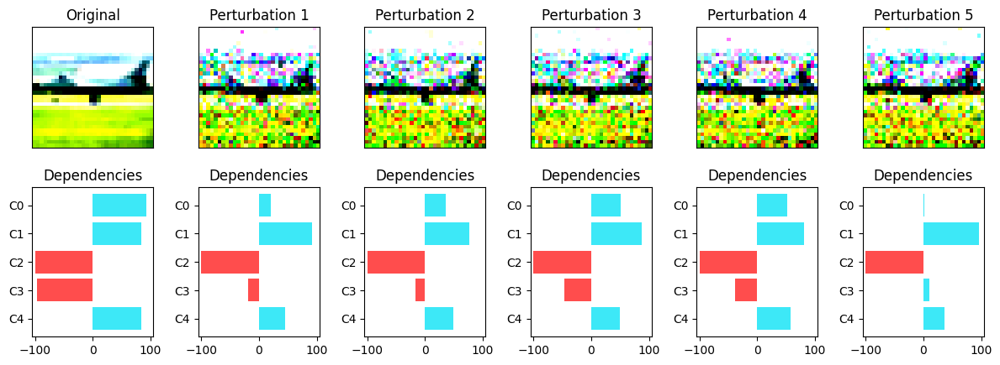

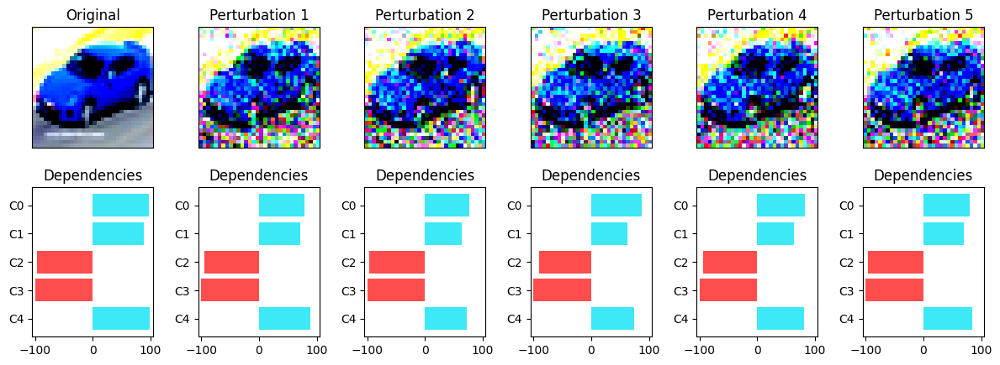

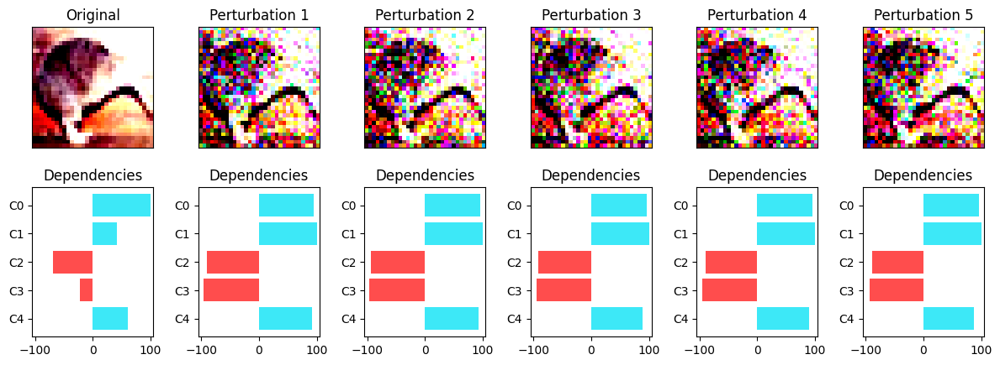

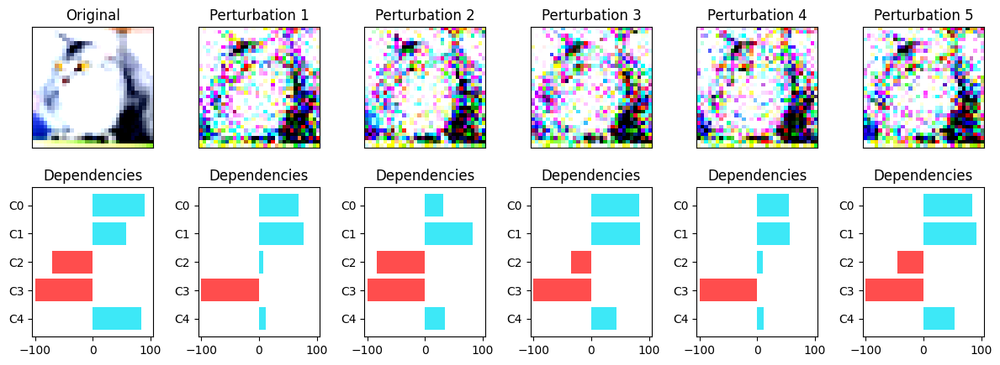

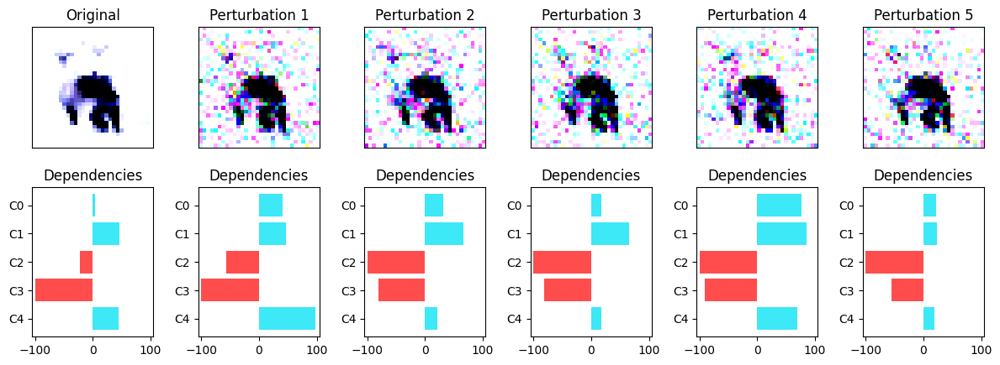

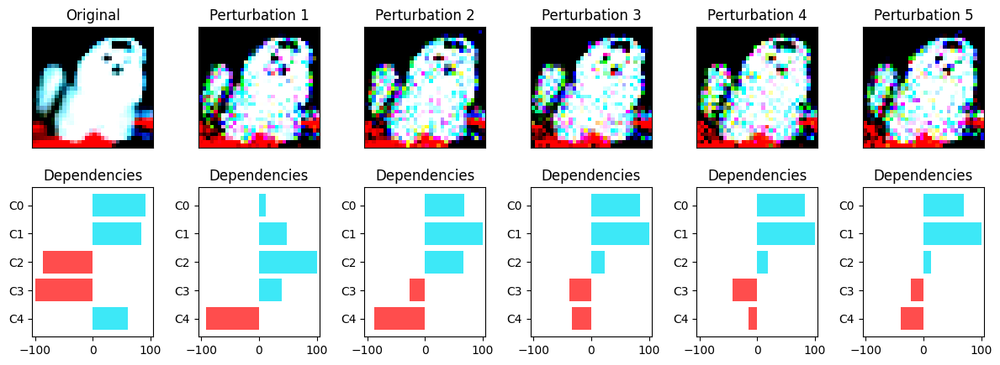

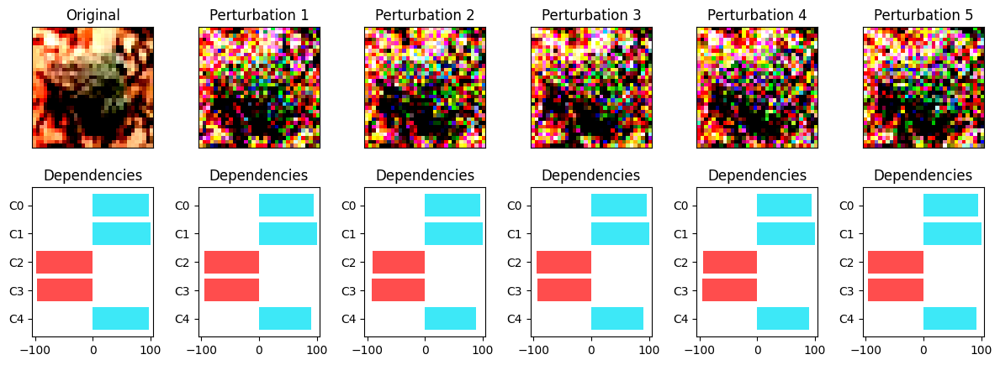

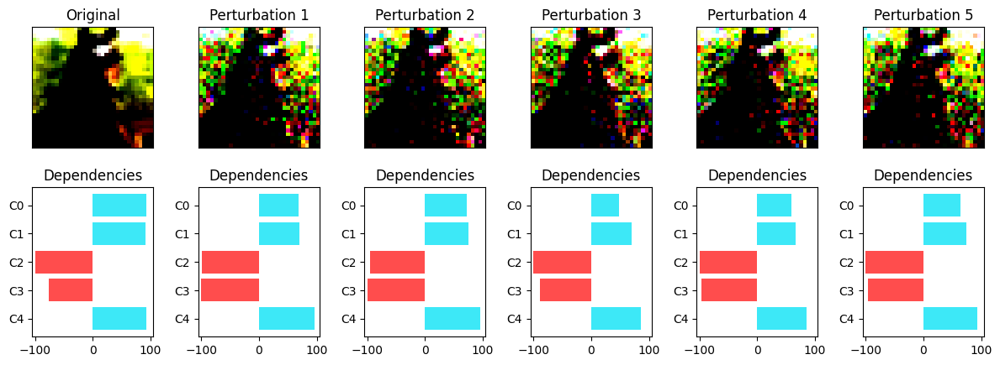

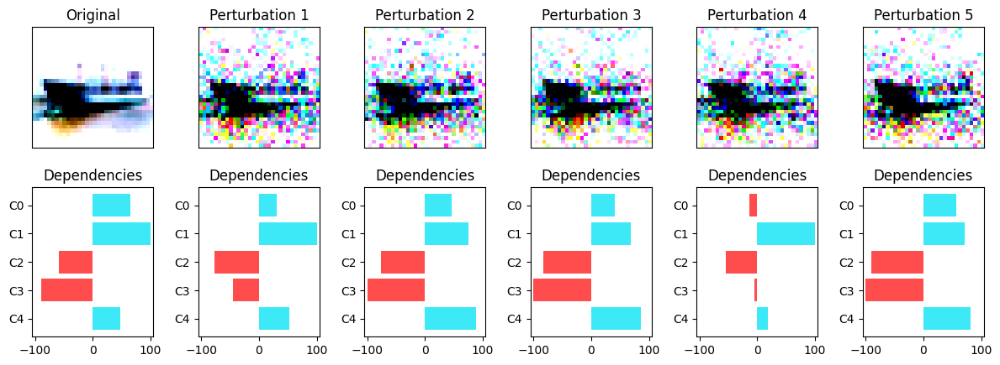

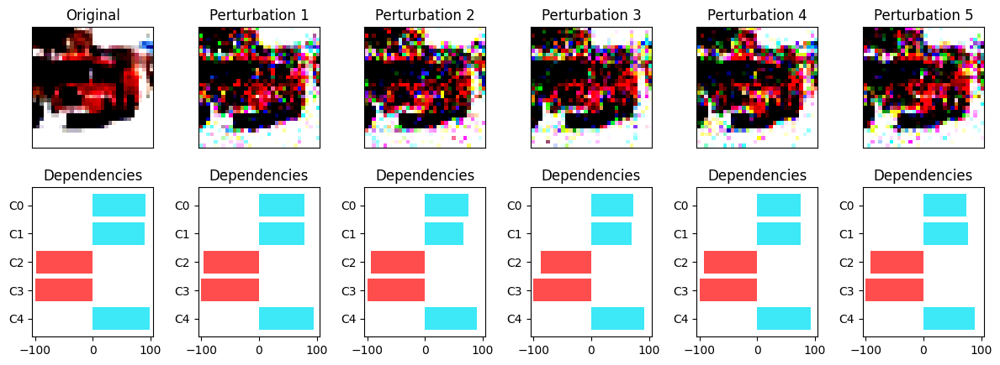

In [69]:
noise_stability_plots(cifar10_SENN, test_dl.dataset, False, "")

<a name="limeexp"></a>
# 5. Lime Explantions

In [70]:
from lime import lime_image
from skimage.segmentation import mark_boundaries, slic
from skimage.segmentation import slic
from skimage.color import label2rgb

In [71]:
def get_preprocess_transform():
    # Standard normalization values for CIFAR-10
    CIFAR10_MEAN = (0.4914, 0.4822, 0.4465)
    CIFAR10_STD = (0.2470, 0.2435, 0.2616)

    transf = transforms.Compose([
        transforms.ToPILImage(),
        transforms.ToTensor(),
        transforms.Normalize(CIFAR10_MEAN, CIFAR10_STD)
    ])

    return transf

preprocess_transform = get_preprocess_transform()

In [72]:
def batch_predict(images):
    model.eval()
    batch = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    batch = batch.to(device)

    logits = model(batch)
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

In [73]:
# Segmentation function
def segmentation_fn(image):
    return slic(image, n_segments=75, compactness=10, sigma=1)

In [74]:
model = SENNWrapper(cifar10_SENN)

In [75]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

## Intelligibility

In [76]:
examples = get_selected_examples()

In [77]:
def visualize_lime_explanations(model, explainer, examples, device='cuda', lime_num_samples=1000):
    """
    Generate and visualize LIME explanations for multiple images.

    Args:
        model: The model to explain
        examples: Tensor of shape [N, 3, 32, 32] containing N images
        device: Device to run on
        lime_num_samples: Number of samples for LIME explanation
    """
    model.eval()
    model.to(device)

    num_images = examples.shape[0]
    fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))

    # Handle single image case
    if num_images == 1:
        axes = axes.reshape(1, -1)

    for i in range(num_images):
        image_tensor = examples[i]

        # Prepare image for LIME (convert to HWC format, [0, 255] range)
        rgb_image = unnormalize(image_tensor)
        rgb_image = rgb_image.detach().cpu().numpy()
        rgb_image = np.transpose(rgb_image, (1, 2, 0))  # CHW → HWC
        rgb_image = (rgb_image * 255.0).astype(np.uint8)

        label = i  # Ground truth is the index

        print(f"Processing image {i+1}/{num_images}...")

        try:
            # Generate LIME explanation
            explanation = explainer.explain_instance(
                rgb_image,
                batch_predict,
                top_labels=5,
                hide_color=0,
                num_samples=lime_num_samples,
                segmentation_fn=segmentation_fn
            )

            # Plot 1: Original Image
            axes[i, 0].imshow(rgb_image)
            axes[i, 0].set_title(f"Original Image\\nTrue Label: {label}")
            axes[i, 0].axis('off')

            # Plot 2: Top 5 positive superpixels
            temp, mask = explanation.get_image_and_mask(
                explanation.top_labels[0],
                positive_only=True,
                num_features=5,
                hide_rest=False
            )
            img_boundry1 = mark_boundaries(temp/255.0, mask)

            axes[i, 1].imshow(img_boundry1)
            axes[i, 1].set_title(f"Top 5 Positive Features\\nClass: {explanation.top_labels[0]}")
            axes[i, 1].axis('off')

            # Plot 3: Top 10 most influential superpixels (positive + negative)
            temp, mask = explanation.get_image_and_mask(
                explanation.top_labels[0],
                positive_only=False,
                num_features=10,
                hide_rest=False
            )
            img_boundry2 = mark_boundaries(temp/255.0, mask)

            axes[i, 2].imshow(img_boundry2)
            axes[i, 2].set_title(f"Top 10 Features\\nClass: {explanation.top_labels[0]}")
            axes[i, 2].axis('off')

            # Plot 4: Top 5 positive, hide rest
            temp, mask = explanation.get_image_and_mask(
                explanation.top_labels[0],
                positive_only=True,
                num_features=5,
                hide_rest=True
            )
            img_boundry3 = mark_boundaries(temp/255.0, mask)

            axes[i, 3].imshow(img_boundry3)
            axes[i, 3].set_title(f"Top 5 Positive Only\\nClass: {explanation.top_labels[0]}")
            axes[i, 3].axis('off')

        except Exception as e:
            print(f"Error processing image {i+1}: {e}")
            # Fill with empty plots if error occurs
            for j in range(4):
                axes[i, j].text(0.5, 0.5, f'Error\\nprocessing\\nimage {i+1}',
                               ha='center', va='center', transform=axes[i, j].transAxes)
                axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

Processing image 1/10...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing image 2/10...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing image 3/10...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing image 4/10...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing image 5/10...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing image 6/10...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing image 7/10...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing image 8/10...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing image 9/10...


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing image 10/10...


  0%|          | 0/1000 [00:00<?, ?it/s]

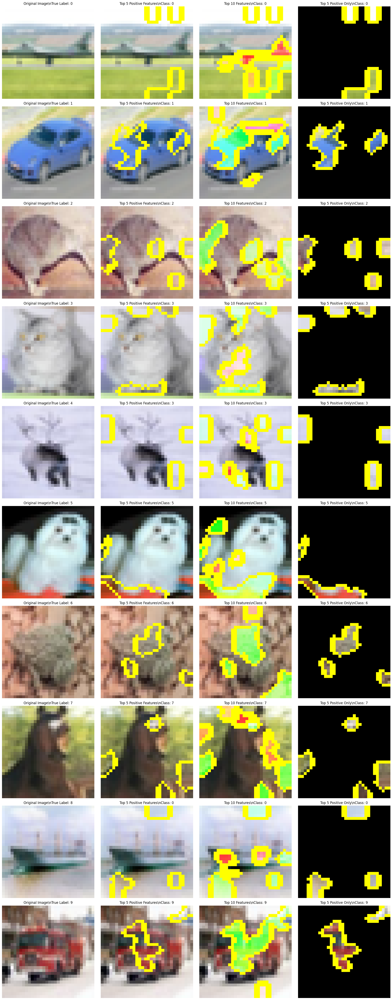

In [78]:
# Set random seeds for reproducibility
seed = 10
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)

# LIME Explainer
explainer = lime_image.LimeImageExplainer(random_state=seed)

visualize_lime_explanations(model, explainer, examples, device)

## Faithfulness

In [93]:
def remove_superpixels(image, segments, superpixel_ids, removal_color='gray'):
    image_copy = image.copy()
    if removal_color == 'gray':
        replacement = np.mean(image_copy, axis=(0, 1), dtype=int)
    elif removal_color == 'black':
        replacement = [0, 0, 0]
    elif removal_color == 'white':
        replacement = [255, 255, 255]
    else:
        raise ValueError("Unknown removal color")

    for sp_id in superpixel_ids:
        image_copy[segments == sp_id] = replacement
    return image_copy

In [94]:
from scipy.stats import spearmanr

In [95]:
def evaluate_faithfulness_lime(
    model, explainer, examples, labels, device='cuda',
    removal_percentages=[5, 10, 20, 30, 50],
    lime_num_samples=1000,
    removal_color='gray'
):
    """
    Evaluate LIME faithfulness by removing top percentage of important superpixels
    and measuring prediction changes - matches IG evaluation format.
    """
    model.eval()
    model.to(device)

    # Store results for each removal percentage
    results = {
        'confidence_drops': {pct: [] for pct in removal_percentages},
        'prediction_flips': {pct: [] for pct in removal_percentages},
        'mean_confidence_drops': {},
        'mean_prediction_flip_rates': {}
    }

    for idx in tqdm(range(len(examples)), desc="Evaluating LIME faithfulness"):
        # Get single image
        x = examples[idx].unsqueeze(0).to(device)
        true_label = labels[idx]

        with torch.no_grad():
            logits = model(x)[0] if isinstance(model(x), tuple) else model(x)
            probs = F.softmax(logits, dim=1)
            original_pred_label = probs.argmax(dim=1)[0].item()
            original_confidence = probs[0, original_pred_label].item()

        # Prepare image for LIME
        image_tensor = x[0].cpu()
        image = unnormalize(image_tensor).numpy()
        image = np.transpose(image, (1, 2, 0))  # CHW → HWC
        image = (image * 255).astype(np.uint8)

        try:
            explanation = explainer.explain_instance(
                image,
                batch_predict,
                top_labels=1,
                hide_color=0,
                num_samples=lime_num_samples,
                segmentation_fn=segmentation_fn
            )

            segments = explanation.segments
            label = explanation.top_labels[0]
            local_exp = explanation.local_exp[label]

            # Get positive segments (features that vote for the class)
            # positive_segments = [seg for seg in local_exp if seg[1] > 0]
            # if not positive_segments:
            #     continue

            # sorted_segments = sorted(positive_segments, key=lambda x: x[1], reverse=True)
            # total_segments = len(positive_segments)

            # Get all segments with their absolute importance values
            abs_segments = [(seg[0], abs(seg[1])) for seg in local_exp]
            if not abs_segments:
                continue

            sorted_segments = sorted(abs_segments, key=lambda x: x[1], reverse=True)
            total_segments = len(abs_segments)

            # Test each removal percentage
            for removal_pct in removal_percentages:
                # Calculate number of superpixels to remove
                num_to_remove = max(1, int(total_segments * (removal_pct / 100.0)))
                num_to_remove = min(num_to_remove, len(sorted_segments))

                # Get top important superpixels
                top_segments = [seg[0] for seg in sorted_segments[:num_to_remove]]

                # Remove superpixels
                perturbed_img = remove_superpixels(image, segments, top_segments, removal_color=removal_color)

                # Get prediction on modified image
                modified_probs = batch_predict(np.array([perturbed_img]))[0]
                modified_pred_label = np.argmax(modified_probs)
                modified_confidence = modified_probs[original_pred_label]  # Confidence for original class

                # Calculate metrics
                confidence_drop = original_confidence - modified_confidence
                prediction_flip = 1 if modified_pred_label != original_pred_label else 0

                # Store results
                results['confidence_drops'][removal_pct].append(confidence_drop)
                results['prediction_flips'][removal_pct].append(prediction_flip)

        except Exception as e:
            print(f"Error processing sample {idx}: {e}")
            continue

    # Calculate mean statistics
    for pct in removal_percentages:
        if results['confidence_drops'][pct]:
            results['mean_confidence_drops'][pct] = np.mean(results['confidence_drops'][pct])
            results['mean_prediction_flip_rates'][pct] = np.mean(results['prediction_flips'][pct])
        else:
            results['mean_confidence_drops'][pct] = 0.0
            results['mean_prediction_flip_rates'][pct] = 0.0

    return results

In [96]:
examples, true_labels = get_subsample()

In [97]:
# Set random seeds for reproducibility
seed = 10
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)

# LIME Explainer
explainer = lime_image.LimeImageExplainer(random_state=seed)
removal_percentages = [5, 10, 20, 30, 50]

# Run faithfulness evaluation
faithfulness_results = evaluate_faithfulness_lime(
    model=model,
    explainer=explainer,
    examples=examples,
    labels=true_labels,
    device='cuda',
    removal_percentages=removal_percentages,
    lime_num_samples=1000,
    removal_color='gray'
)

Evaluating LIME faithfulness:   0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:   1%|          | 1/100 [00:01<01:43,  1.04s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:   2%|▏         | 2/100 [00:02<01:48,  1.11s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:   3%|▎         | 3/100 [00:03<01:43,  1.07s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:   4%|▍         | 4/100 [00:04<01:36,  1.01s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:   5%|▌         | 5/100 [00:05<01:31,  1.04it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:   6%|▌         | 6/100 [00:05<01:27,  1.07it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:   7%|▋         | 7/100 [00:06<01:24,  1.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:   8%|▊         | 8/100 [00:07<01:22,  1.12it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:   9%|▉         | 9/100 [00:08<01:20,  1.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  10%|█         | 10/100 [00:09<01:18,  1.14it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  11%|█         | 11/100 [00:10<01:18,  1.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  12%|█▏        | 12/100 [00:11<01:17,  1.14it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  13%|█▎        | 13/100 [00:11<01:16,  1.14it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  14%|█▍        | 14/100 [00:12<01:17,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  15%|█▌        | 15/100 [00:14<01:22,  1.02it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  16%|█▌        | 16/100 [00:15<01:27,  1.04s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  17%|█▋        | 17/100 [00:16<01:21,  1.01it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  18%|█▊        | 18/100 [00:17<01:18,  1.04it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  19%|█▉        | 19/100 [00:17<01:15,  1.07it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  20%|██        | 20/100 [00:18<01:13,  1.09it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  21%|██        | 21/100 [00:19<01:11,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  22%|██▏       | 22/100 [00:20<01:09,  1.12it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  23%|██▎       | 23/100 [00:21<01:08,  1.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  24%|██▍       | 24/100 [00:22<01:07,  1.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  25%|██▌       | 25/100 [00:23<01:05,  1.14it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  26%|██▌       | 26/100 [00:24<01:05,  1.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  27%|██▋       | 27/100 [00:24<01:03,  1.15it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  28%|██▊       | 28/100 [00:25<01:07,  1.06it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  29%|██▉       | 29/100 [00:27<01:12,  1.02s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  30%|███       | 30/100 [00:28<01:10,  1.01s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  31%|███       | 31/100 [00:29<01:07,  1.03it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  32%|███▏      | 32/100 [00:29<01:04,  1.06it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  33%|███▎      | 33/100 [00:30<01:02,  1.08it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  34%|███▍      | 34/100 [00:31<01:00,  1.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  35%|███▌      | 35/100 [00:32<00:58,  1.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  36%|███▌      | 36/100 [00:33<00:57,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  37%|███▋      | 37/100 [00:34<00:56,  1.12it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  38%|███▊      | 38/100 [00:35<00:55,  1.12it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  39%|███▉      | 39/100 [00:36<00:53,  1.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  40%|████      | 40/100 [00:36<00:52,  1.14it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  41%|████      | 41/100 [00:37<00:53,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  42%|████▏     | 42/100 [00:39<00:56,  1.03it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  43%|████▎     | 43/100 [00:40<00:58,  1.03s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  44%|████▍     | 44/100 [00:41<00:55,  1.00it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  45%|████▌     | 45/100 [00:41<00:52,  1.05it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  46%|████▌     | 46/100 [00:42<00:50,  1.06it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  47%|████▋     | 47/100 [00:43<00:49,  1.07it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  48%|████▊     | 48/100 [00:44<00:47,  1.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  49%|████▉     | 49/100 [00:45<00:45,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  50%|█████     | 50/100 [00:46<00:44,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  51%|█████     | 51/100 [00:47<00:44,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  52%|█████▏    | 52/100 [00:48<00:42,  1.12it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  53%|█████▎    | 53/100 [00:49<00:41,  1.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  54%|█████▍    | 54/100 [00:49<00:40,  1.14it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  55%|█████▌    | 55/100 [00:51<00:43,  1.03it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  56%|█████▌    | 56/100 [00:52<00:46,  1.07s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  57%|█████▋    | 57/100 [00:53<00:43,  1.01s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  58%|█████▊    | 58/100 [00:54<00:40,  1.03it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  59%|█████▉    | 59/100 [00:55<00:38,  1.07it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  60%|██████    | 60/100 [00:55<00:37,  1.08it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  61%|██████    | 61/100 [00:56<00:35,  1.09it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  62%|██████▏   | 62/100 [00:57<00:34,  1.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  63%|██████▎   | 63/100 [00:58<00:33,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  64%|██████▍   | 64/100 [00:59<00:32,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  65%|██████▌   | 65/100 [01:00<00:30,  1.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  66%|██████▌   | 66/100 [01:01<00:30,  1.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  67%|██████▋   | 67/100 [01:02<00:29,  1.13it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  68%|██████▊   | 68/100 [01:03<00:30,  1.05it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  69%|██████▉   | 69/100 [01:05<00:40,  1.31s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  70%|███████   | 70/100 [01:06<00:41,  1.40s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  71%|███████   | 71/100 [01:07<00:35,  1.24s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  72%|███████▏  | 72/100 [01:08<00:31,  1.14s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  73%|███████▎  | 73/100 [01:09<00:28,  1.05s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  74%|███████▍  | 74/100 [01:10<00:25,  1.01it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  75%|███████▌  | 75/100 [01:11<00:24,  1.04it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  76%|███████▌  | 76/100 [01:12<00:22,  1.06it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  77%|███████▋  | 77/100 [01:13<00:21,  1.07it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  78%|███████▊  | 78/100 [01:14<00:20,  1.09it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  79%|███████▉  | 79/100 [01:14<00:18,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  80%|████████  | 80/100 [01:16<00:19,  1.03it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  81%|████████  | 81/100 [01:17<00:20,  1.06s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  82%|████████▏ | 82/100 [01:18<00:18,  1.02s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  83%|████████▎ | 83/100 [01:19<00:16,  1.02it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  84%|████████▍ | 84/100 [01:20<00:15,  1.04it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  85%|████████▌ | 85/100 [01:20<00:14,  1.06it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  86%|████████▌ | 86/100 [01:21<00:13,  1.08it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  87%|████████▋ | 87/100 [01:22<00:11,  1.09it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  88%|████████▊ | 88/100 [01:23<00:10,  1.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  89%|████████▉ | 89/100 [01:24<00:10,  1.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  90%|█████████ | 90/100 [01:25<00:09,  1.10it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  91%|█████████ | 91/100 [01:26<00:08,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  92%|█████████▏| 92/100 [01:27<00:07,  1.11it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  93%|█████████▎| 93/100 [01:28<00:06,  1.03it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  94%|█████████▍| 94/100 [01:29<00:06,  1.04s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  95%|█████████▌| 95/100 [01:30<00:05,  1.04s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  96%|█████████▌| 96/100 [01:31<00:03,  1.01it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  97%|█████████▋| 97/100 [01:32<00:02,  1.04it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  98%|█████████▊| 98/100 [01:33<00:01,  1.06it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness:  99%|█████████▉| 99/100 [01:34<00:00,  1.08it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Evaluating LIME faithfulness: 100%|██████████| 100/100 [01:35<00:00,  1.05it/s]


In [98]:
# Print summary statistics
removal_percentages = [5, 10, 20, 30, 50]
print("\nFaithfulness Evaluation Summary:")
print("=" * 50)
for pct in removal_percentages:
    print(f"Removing top {pct}% pixels:")
    print(f"  Mean confidence drop: {faithfulness_results['mean_confidence_drops'][pct]:.4f}")
    print(f"  Prediction flip rate: {faithfulness_results['mean_prediction_flip_rates'][pct]:.4f}")
    print()


Faithfulness Evaluation Summary:
Removing top 5% pixels:
  Mean confidence drop: 0.0423
  Prediction flip rate: 0.1200

Removing top 10% pixels:
  Mean confidence drop: 0.0757
  Prediction flip rate: 0.1400

Removing top 20% pixels:
  Mean confidence drop: 0.1386
  Prediction flip rate: 0.2100

Removing top 30% pixels:
  Mean confidence drop: 0.2193
  Prediction flip rate: 0.3700

Removing top 50% pixels:
  Mean confidence drop: 0.3169
  Prediction flip rate: 0.4300



## Stability

In [90]:
def add_gaussian_noise(image, noise_std=0.05):
    """Add Gaussian noise to image."""
    image_normalized = image.astype(np.float32) / 255.0
    noise = np.random.normal(0, noise_std, image_normalized.shape)
    noisy_image_normalized = np.clip(image_normalized + noise, 0, 1)
    return (noisy_image_normalized * 255).astype(np.uint8)

def calculate_jaccard_similarity(set1, set2):
    """Calculate Jaccard similarity between two sets."""
    if len(set1.union(set2)) == 0:
        return 0.0
    return len(set1.intersection(set2)) / len(set1.union(set2))

def evaluate_lime_stability(
    model, explainer, examples, labels, device='cuda',
    num_noise_levels=5,
    noise_std_range=(0.01, 0.1),
    lime_num_samples=1000,
    top_k_segments=10
):
    """
    LIME stability evaluation using only Jaccard similarity.

    Args:
        model: The model to explain
        examples: Tensor of shape [10, 3, 32, 32] containing 10 images
        device: Device to run on
        num_noise_levels: Number of different noise levels to test
        noise_std_range: (min_std, max_std) range for noise standard deviation
        lime_num_samples: Number of samples for LIME explanation
        top_k_segments: Number of top segments to consider for stability

    Returns:
        dict: Contains jaccard similarities and basic statistics
    """
    model.eval()
    model.to(device)

    noise_levels = np.linspace(noise_std_range[0], noise_std_range[1], num_noise_levels)

    all_jaccard_similarities = []
    per_noise_similarities = {noise_std: [] for noise_std in noise_levels}

    successful_comparisons = 0
    prediction_changes = 0

    for idx in tqdm(range(len(examples)), desc="Processing examples"):
        # Get single image
        x = examples[idx].unsqueeze(0).to(device)  # Add batch dimension
        true_label = true_labels[idx]

        # Get original prediction
        with torch.no_grad():
            logits = model(x)[0] if isinstance(model(x), tuple) else model(x)
            original_pred_label = F.softmax(logits, dim=1).argmax(dim=1)[0].item()

        # Prepare image for LIME
        image_tensor = x[0].cpu()
        image = unnormalize(image_tensor).numpy()
        image = np.transpose(image, (1, 2, 0))  # CHW → HWC
        image = (image * 255).astype(np.uint8)

        print(f"Example {idx + 1}, True label: {true_label}, Predicted: {original_pred_label}")

        try:
            # Get original explanation
            explanation_original = explainer.explain_instance(
                image, batch_predict, top_labels=5, hide_color=0,
                num_samples=lime_num_samples, segmentation_fn=segmentation_fn
            )

            if original_pred_label not in explanation_original.local_exp:
                print(f"  Skipping: No explanation for predicted class {original_pred_label}")
                continue

            # Get top segments from original explanation
            local_exp_original = explanation_original.local_exp[original_pred_label]
            sorted_segments_original = sorted(local_exp_original, key=lambda x: abs(x[1]), reverse=True)
            top_segments_original = set([seg[0] for seg in sorted_segments_original[:top_k_segments]])

            # Test each noise level
            for noise_std in noise_levels:
                noisy_image = add_gaussian_noise(image, noise_std=noise_std)

                # Check if prediction changes
                noisy_tensor = torch.from_numpy(noisy_image).float().permute(2, 0, 1) / 255.0
                noisy_tensor = noisy_tensor.unsqueeze(0).to(device)

                with torch.no_grad():
                    noisy_logits = model(noisy_tensor)[0] if isinstance(model(noisy_tensor), tuple) else model(noisy_tensor)
                    noisy_pred_label = F.softmax(noisy_logits, dim=1).argmax(dim=1)[0].item()

                if noisy_pred_label != original_pred_label:
                    prediction_changes += 1
                    print(f"  Prediction changed for noise σ={noise_std:.3f}: {original_pred_label} → {noisy_pred_label}")

                # Get noisy explanation
                explanation_noisy = explainer.explain_instance(
                    noisy_image, batch_predict, top_labels=5, hide_color=0,
                    num_samples=lime_num_samples, segmentation_fn=segmentation_fn
                )

                # Use original prediction label for consistency
                target_label = original_pred_label
                if target_label not in explanation_noisy.local_exp and noisy_pred_label in explanation_noisy.local_exp:
                    target_label = noisy_pred_label
                    print(f"  Using new prediction label {noisy_pred_label} for explanation")

                if target_label in explanation_noisy.local_exp:
                    local_exp_noisy = explanation_noisy.local_exp[target_label]
                    sorted_segments_noisy = sorted(local_exp_noisy, key=lambda x: abs(x[1]), reverse=True)
                    top_segments_noisy = set([seg[0] for seg in sorted_segments_noisy[:top_k_segments]])

                    # Calculate Jaccard similarity
                    jaccard = calculate_jaccard_similarity(top_segments_original, top_segments_noisy)
                    all_jaccard_similarities.append(jaccard)
                    per_noise_similarities[noise_std].append(jaccard)
                    successful_comparisons += 1
                else:
                    print(f"  Skipping noise level σ={noise_std:.3f}: No explanation available")

        except Exception as e:
            print(f"Error processing example {idx + 1}: {e}")

    # Calculate statistics
    if len(all_jaccard_similarities) == 0:
        print("No successful comparisons found!")
        return None

    results = {
        'jaccard_similarities': all_jaccard_similarities,
        'mean_jaccard': np.mean(all_jaccard_similarities),
        'std_jaccard': np.std(all_jaccard_similarities),
        'min_jaccard': np.min(all_jaccard_similarities),
        'max_jaccard': np.max(all_jaccard_similarities),
        'noise_levels': noise_levels,
        'per_noise_similarities': per_noise_similarities,
        'examples_processed': len(examples),
        'successful_comparisons': successful_comparisons,
        'prediction_changes': prediction_changes
    }

    return results

def print_stability_summary(results):
    """Print summary of stability results."""
    if results is None:
        print("No results to display!")
        return
    print()
    print("=" * 50)
    print("LIME STABILITY ANALYSIS - JACCARD SIMILARITY")
    print("=" * 50)
    print(f"Examples processed: {results['examples_processed']}")
    print(f"Successful comparisons: {results['successful_comparisons']}")
    print(f"Prediction changes: {results['prediction_changes']}")
    print(f"Noise levels: {results['noise_levels']}")

    print(f"\nOverall Jaccard Similarity:")
    print(f"  Mean: {results['mean_jaccard']:.4f}")
    print(f"  Std:  {results['std_jaccard']:.4f}")
    print(f"  Min:  {results['min_jaccard']:.4f}")
    print(f"  Max:  {results['max_jaccard']:.4f}")

    print(f"\nBy Noise Level:")
    for noise_std in results['noise_levels']:
        similarities = results['per_noise_similarities'][noise_std]
        if len(similarities) > 0:
            mean_sim = np.mean(similarities)
            print(f"  σ = {noise_std:.3f}: {mean_sim:.4f} ({len(similarities)} samples)")
        else:
            print(f"  σ = {noise_std:.3f}: No data")

    print("\n" + "=" * 50)

In [91]:
examples, true_labels = get_subsample()

In [92]:
# Set random seeds for reproducibility
seed = 10
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)

results = evaluate_lime_stability(
    model=model,
    explainer=explainer,
    examples=examples,
    labels=true_labels,
    device='cuda',
    num_noise_levels=5,
    noise_std_range=(0.01, 0.1),
    lime_num_samples=1000,
    top_k_segments=10
)

print_stability_summary(results)

Processing examples:   0%|          | 0/100 [00:00<?, ?it/s]

Example 1, True label: 8, Predicted: 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 1 → 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:   1%|          | 1/100 [00:05<08:53,  5.39s/it]

Example 2, True label: 5, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:   2%|▏         | 2/100 [00:11<09:29,  5.81s/it]

  Using new prediction label 3 for explanation
Example 3, True label: 3, Predicted: 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:   3%|▎         | 3/100 [00:16<08:59,  5.56s/it]

Example 4, True label: 2, Predicted: 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:   4%|▍         | 4/100 [00:22<09:13,  5.77s/it]

Example 5, True label: 6, Predicted: 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:   5%|▌         | 5/100 [00:28<08:50,  5.58s/it]

  Skipping noise level σ=0.100: No explanation available
Example 6, True label: 9, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:   6%|▌         | 6/100 [00:34<09:22,  5.99s/it]

Example 7, True label: 5, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:   7%|▋         | 7/100 [00:41<09:25,  6.08s/it]

Example 8, True label: 9, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:   8%|▊         | 8/100 [00:49<10:28,  6.83s/it]

Example 9, True label: 1, Predicted: 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:   9%|▉         | 9/100 [00:55<09:43,  6.42s/it]

Example 10, True label: 2, Predicted: 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  10%|█         | 10/100 [01:01<09:27,  6.31s/it]

Example 11, True label: 2, Predicted: 2


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 2 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 2 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  11%|█         | 11/100 [01:07<09:15,  6.24s/it]

Example 12, True label: 2, Predicted: 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  12%|█▏        | 12/100 [01:15<10:10,  6.93s/it]

Example 13, True label: 8, Predicted: 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 8 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 8 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 8 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 8 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 8 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  13%|█▎        | 13/100 [01:21<09:21,  6.45s/it]

Example 14, True label: 7, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  14%|█▍        | 14/100 [01:27<09:09,  6.39s/it]

Example 15, True label: 6, Predicted: 6


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  15%|█▌        | 15/100 [01:32<08:40,  6.12s/it]

Example 16, True label: 7, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  16%|█▌        | 16/100 [01:40<09:05,  6.49s/it]

Example 17, True label: 8, Predicted: 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 0 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 0 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  17%|█▋        | 17/100 [01:45<08:34,  6.20s/it]

Example 18, True label: 3, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  18%|█▊        | 18/100 [01:51<08:28,  6.20s/it]

  Using new prediction label 3 for explanation
Example 19, True label: 4, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  19%|█▉        | 19/100 [01:58<08:33,  6.34s/it]

Example 20, True label: 4, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Using new prediction label 3 for explanation
  Prediction changed for noise σ=0.077: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Using new prediction label 3 for explanation
  Prediction changed for noise σ=0.100: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  20%|██        | 20/100 [02:05<08:47,  6.59s/it]

  Using new prediction label 3 for explanation
Example 21, True label: 7, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  21%|██        | 21/100 [02:11<08:16,  6.28s/it]

Example 22, True label: 1, Predicted: 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  22%|██▏       | 22/100 [02:17<08:09,  6.28s/it]

Example 23, True label: 3, Predicted: 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 4 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 4 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  23%|██▎       | 23/100 [02:22<07:43,  6.01s/it]

  Skipping noise level σ=0.100: No explanation available
Example 24, True label: 2, Predicted: 2


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  24%|██▍       | 24/100 [02:29<07:57,  6.28s/it]

Example 25, True label: 2, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Using new prediction label 3 for explanation
  Prediction changed for noise σ=0.077: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Using new prediction label 3 for explanation
  Prediction changed for noise σ=0.100: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  25%|██▌       | 25/100 [02:35<07:33,  6.05s/it]

  Skipping noise level σ=0.100: No explanation available
Example 26, True label: 2, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  26%|██▌       | 26/100 [02:41<07:33,  6.13s/it]

Example 27, True label: 9, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 2


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  27%|██▋       | 27/100 [02:47<07:12,  5.92s/it]

Example 28, True label: 1, Predicted: 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  28%|██▊       | 28/100 [02:53<07:15,  6.04s/it]

Example 29, True label: 5, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  29%|██▉       | 29/100 [02:59<06:59,  5.90s/it]

Example 30, True label: 5, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  30%|███       | 30/100 [03:05<06:57,  5.96s/it]

Example 31, True label: 7, Predicted: 2


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 2 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  31%|███       | 31/100 [03:11<06:50,  5.95s/it]

Example 32, True label: 3, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  32%|███▏      | 32/100 [03:16<06:41,  5.91s/it]

Example 33, True label: 1, Predicted: 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 1 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 1 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 1 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 1 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 1 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  33%|███▎      | 33/100 [03:23<06:40,  5.98s/it]

Example 34, True label: 2, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  34%|███▍      | 34/100 [03:28<06:26,  5.86s/it]

Example 35, True label: 5, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Skipping noise level σ=0.077: No explanation available
  Prediction changed for noise σ=0.100: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  35%|███▌      | 35/100 [03:35<06:30,  6.01s/it]

  Skipping noise level σ=0.100: No explanation available
Example 36, True label: 9, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  36%|███▌      | 36/100 [03:40<06:16,  5.89s/it]

Example 37, True label: 2, Predicted: 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  37%|███▋      | 37/100 [03:46<06:20,  6.04s/it]

Example 38, True label: 6, Predicted: 6


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  38%|███▊      | 38/100 [03:52<06:07,  5.92s/it]

Example 39, True label: 1, Predicted: 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 1 → 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 1 → 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 1 → 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 1 → 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  39%|███▉      | 39/100 [03:59<06:10,  6.08s/it]

Example 40, True label: 7, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  40%|████      | 40/100 [04:04<05:57,  5.96s/it]

Example 41, True label: 4, Predicted: 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  41%|████      | 41/100 [04:11<06:04,  6.18s/it]

Example 42, True label: 3, Predicted: 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  42%|████▏     | 42/100 [04:17<05:51,  6.05s/it]

Example 43, True label: 3, Predicted: 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 0 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  43%|████▎     | 43/100 [04:23<05:53,  6.21s/it]

Example 44, True label: 4, Predicted: 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  44%|████▍     | 44/100 [04:29<05:40,  6.08s/it]

Example 45, True label: 7, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  45%|████▌     | 45/100 [04:36<05:42,  6.23s/it]

Example 46, True label: 4, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  46%|████▌     | 46/100 [04:41<05:29,  6.10s/it]

  Using new prediction label 3 for explanation
Example 47, True label: 4, Predicted: 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  47%|████▋     | 47/100 [04:48<05:26,  6.16s/it]

Example 48, True label: 8, Predicted: 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 8 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  48%|████▊     | 48/100 [04:54<05:17,  6.10s/it]

Example 49, True label: 4, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 5 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 5 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 5 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  49%|████▉     | 49/100 [05:00<05:10,  6.10s/it]

Example 50, True label: 4, Predicted: 2


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 2 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 2 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 2 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  50%|█████     | 50/100 [05:06<05:08,  6.17s/it]

Example 51, True label: 6, Predicted: 6


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 6 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 6 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 6 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  51%|█████     | 51/100 [05:12<05:01,  6.15s/it]

Example 52, True label: 9, Predicted: 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  52%|█████▏    | 52/100 [05:19<05:00,  6.25s/it]

Example 53, True label: 0, Predicted: 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 0 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 0 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 0 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 0 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 0 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  53%|█████▎    | 53/100 [05:25<04:48,  6.14s/it]

Example 54, True label: 7, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  54%|█████▍    | 54/100 [05:31<04:48,  6.27s/it]

Example 55, True label: 8, Predicted: 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  55%|█████▌    | 55/100 [05:37<04:36,  6.14s/it]

Example 56, True label: 4, Predicted: 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  56%|█████▌    | 56/100 [05:44<04:37,  6.31s/it]

Example 57, True label: 3, Predicted: 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  57%|█████▋    | 57/100 [05:50<04:25,  6.18s/it]

Example 58, True label: 5, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  58%|█████▊    | 58/100 [05:56<04:25,  6.32s/it]

  Using new prediction label 3 for explanation
Example 59, True label: 2, Predicted: 2


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  59%|█████▉    | 59/100 [06:02<04:14,  6.20s/it]

Example 60, True label: 1, Predicted: 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  60%|██████    | 60/100 [06:09<04:15,  6.40s/it]

Example 61, True label: 5, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  61%|██████    | 61/100 [06:15<04:04,  6.26s/it]

Example 62, True label: 3, Predicted: 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  62%|██████▏   | 62/100 [06:22<04:04,  6.42s/it]

Example 63, True label: 5, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  63%|██████▎   | 63/100 [06:28<03:53,  6.30s/it]

Example 64, True label: 5, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  64%|██████▍   | 64/100 [06:35<03:52,  6.46s/it]

Example 65, True label: 3, Predicted: 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  65%|██████▌   | 65/100 [06:40<03:39,  6.28s/it]

Example 66, True label: 2, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  66%|██████▌   | 66/100 [06:47<03:40,  6.47s/it]

Example 67, True label: 6, Predicted: 6


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  67%|██████▋   | 67/100 [06:54<03:30,  6.37s/it]

Example 68, True label: 2, Predicted: 2


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  68%|██████▊   | 68/100 [07:00<03:27,  6.47s/it]

Example 69, True label: 3, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  69%|██████▉   | 69/100 [07:07<03:20,  6.46s/it]

  Using new prediction label 3 for explanation
Example 70, True label: 7, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 7 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  70%|███████   | 70/100 [07:13<03:14,  6.50s/it]

Example 71, True label: 1, Predicted: 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 8 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 8 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 8 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  71%|███████   | 71/100 [07:20<03:06,  6.44s/it]

Example 72, True label: 6, Predicted: 6


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 6 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  72%|███████▏  | 72/100 [07:26<03:01,  6.47s/it]

Example 73, True label: 1, Predicted: 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  73%|███████▎  | 73/100 [07:33<02:54,  6.47s/it]

Example 74, True label: 9, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  74%|███████▍  | 74/100 [07:39<02:46,  6.42s/it]

Example 75, True label: 9, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  75%|███████▌  | 75/100 [07:45<02:41,  6.47s/it]

Example 76, True label: 8, Predicted: 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 0 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 0 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 0 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 0 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 0 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  76%|███████▌  | 76/100 [07:52<02:33,  6.38s/it]

Example 77, True label: 9, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  77%|███████▋  | 77/100 [07:58<02:29,  6.49s/it]

Example 78, True label: 2, Predicted: 2


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 2 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 2 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 2 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 2 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  78%|███████▊  | 78/100 [08:04<02:19,  6.35s/it]

Example 79, True label: 1, Predicted: 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 1 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 1 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  79%|███████▉  | 79/100 [08:11<02:16,  6.52s/it]

Example 80, True label: 9, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 8


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  80%|████████  | 80/100 [08:18<02:08,  6.44s/it]

Example 81, True label: 3, Predicted: 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  81%|████████  | 81/100 [08:25<02:05,  6.61s/it]

Example 82, True label: 9, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  82%|████████▏ | 82/100 [08:31<01:57,  6.50s/it]

Example 83, True label: 3, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  83%|████████▎ | 83/100 [08:38<01:53,  6.70s/it]

Example 84, True label: 1, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  84%|████████▍ | 84/100 [08:45<01:46,  6.68s/it]

Example 85, True label: 1, Predicted: 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  85%|████████▌ | 85/100 [08:57<02:05,  8.37s/it]

Example 86, True label: 3, Predicted: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 7 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 7 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 7 → 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 7 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  86%|████████▌ | 86/100 [09:04<01:51,  7.97s/it]

Example 87, True label: 3, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  87%|████████▋ | 87/100 [09:11<01:39,  7.65s/it]

Example 88, True label: 0, Predicted: 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 0 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  88%|████████▊ | 88/100 [09:18<01:30,  7.51s/it]

Example 89, True label: 6, Predicted: 6


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  89%|████████▉ | 89/100 [09:24<01:19,  7.19s/it]

Example 90, True label: 4, Predicted: 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  90%|█████████ | 90/100 [09:32<01:11,  7.17s/it]

Example 91, True label: 6, Predicted: 6


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 6 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  91%|█████████ | 91/100 [09:38<01:02,  6.94s/it]

Example 92, True label: 3, Predicted: 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  92%|█████████▏| 92/100 [09:45<00:56,  7.04s/it]

Example 93, True label: 5, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  93%|█████████▎| 93/100 [09:52<00:47,  6.80s/it]

Example 94, True label: 6, Predicted: 6


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  94%|█████████▍| 94/100 [09:59<00:41,  6.93s/it]

Example 95, True label: 5, Predicted: 5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Using new prediction label 3 for explanation
  Prediction changed for noise σ=0.100: 5 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  95%|█████████▌| 95/100 [10:05<00:33,  6.75s/it]

  Using new prediction label 3 for explanation
Example 96, True label: 0, Predicted: 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 0 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  96%|█████████▌| 96/100 [10:12<00:27,  6.90s/it]

Example 97, True label: 9, Predicted: 9


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 9 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 9 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 9 → 4


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  97%|█████████▋| 97/100 [10:19<00:20,  6.76s/it]

Example 98, True label: 6, Predicted: 6


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 6 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  98%|█████████▊| 98/100 [10:26<00:13,  6.93s/it]

Example 99, True label: 1, Predicted: 1


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 1 → 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.033: 1 → 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.055: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.077: 1 → 0


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.100: 1 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples:  99%|█████████▉| 99/100 [10:33<00:06,  6.78s/it]

Example 100, True label: 4, Predicted: 4


  0%|          | 0/1000 [00:00<?, ?it/s]

  Prediction changed for noise σ=0.010: 4 → 3


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Processing examples: 100%|██████████| 100/100 [10:40<00:00,  6.40s/it]


LIME STABILITY ANALYSIS - JACCARD SIMILARITY
Examples processed: 100
Successful comparisons: 495
Prediction changes: 379
Noise levels: [0.01   0.0325 0.055  0.0775 0.1   ]

Overall Jaccard Similarity:
  Mean: 0.1631
  Std:  0.1064
  Min:  0.0000
  Max:  0.6667

By Noise Level:
  σ = 0.010: 0.2218 (100 samples)
  σ = 0.033: 0.1825 (100 samples)
  σ = 0.055: 0.1469 (100 samples)
  σ = 0.077: 0.1329 (99 samples)
  σ = 0.100: 0.1301 (96 samples)



<a name="igexp"></a>
# 6. Integrated Gradients Explanations

In [99]:
from captum.attr import IntegratedGradients
from captum.attr import Saliency
from captum.attr import DeepLift
from captum.attr import NoiseTunnel
from captum.attr import visualization as viz

In [100]:
def attribute_image_features(algorithm, input, **kwargs):
    model.zero_grad()
    tensor_attributions = algorithm.attribute(input,
                                              target=0,
                                              **kwargs
                                             )

    return tensor_attributions

In [118]:
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

idx_to_labels = {
    0: "airplane",
    1: "automobile",
    2: "bird",
    3: "cat",
    4: "deer",
    5: "dog",
    6: "frog",
    7: "horse",
    8: "ship",
    9: "truck"
}

In [119]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [120]:
model = model.to(device)

## Intelligibility

In [121]:
examples = get_selected_examples()


--- Processing Image 1 ---
Predicted Class: plane  Probability: 0.9925035238265991
Approximation delta:  tensor([0.0248], device='cuda:0')

--- Processing Image 2 ---
Predicted Class: car  Probability: 0.9763669371604919
Approximation delta:  tensor([0.1364], device='cuda:0')


/usr/local/lib/python3.11/dist-packages/captum/attr/_core/saliency.py:129: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/usr/local/lib/python3.11/dist-packages/captum/attr/_core/deep_lift.py:294: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/usr/local/lib/python3.11/dist-packages/captum/log/dummy_log.py:39: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  return func(*args, **kwargs)



--- Processing Image 3 ---
Predicted Class: bird  Probability: 0.7278669476509094
Approximation delta:  tensor([0.0053], device='cuda:0')

--- Processing Image 4 ---
Predicted Class: cat  Probability: 0.8935098052024841
Approximation delta:  tensor([0.0025], device='cuda:0')

--- Processing Image 5 ---
Predicted Class: cat  Probability: 0.7540740966796875
Approximation delta:  tensor([0.0091], device='cuda:0')

--- Processing Image 6 ---
Predicted Class: dog  Probability: 0.8975905776023865
Approximation delta:  tensor([0.0175], device='cuda:0')

--- Processing Image 7 ---
Predicted Class: frog  Probability: 0.9912803769111633
Approximation delta:  tensor([0.0059], device='cuda:0')

--- Processing Image 8 ---
Predicted Class: horse  Probability: 0.816964328289032
Approximation delta:  tensor([0.0418], device='cuda:0')

--- Processing Image 9 ---
Predicted Class: plane  Probability: 0.610080897808075
Approximation delta:  tensor([0.0053], device='cuda:0')

--- Processing Image 10 ---
P

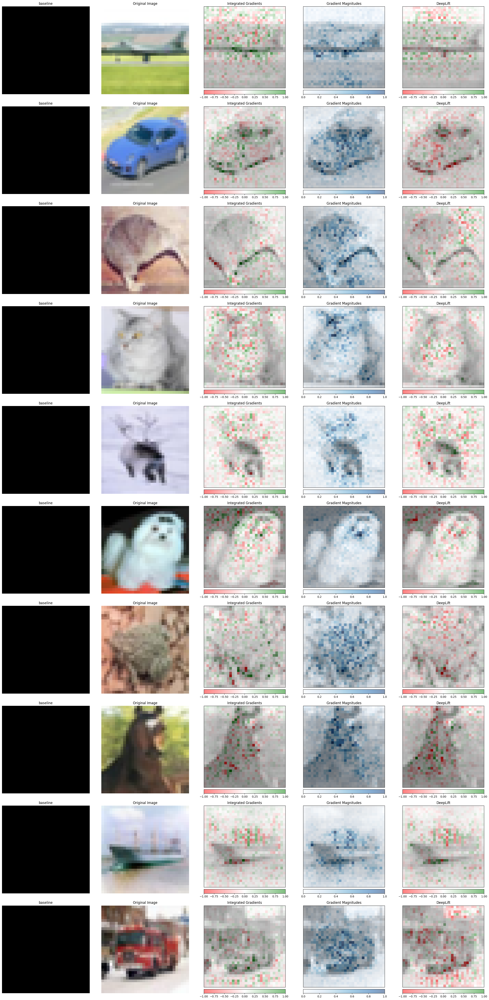

In [122]:
# Determine the number of images and set up the plot grid
num_images = examples.shape[0]
fig, axes = plt.subplots(num_images, 5, figsize=(25, 5* num_images)) # 5 columns: Original + 4 Saliency Maps

if num_images == 1:
    # If there's only one image, axes will be a 1D array. Reshape for consistent indexing.
    axes = axes.reshape(1, -1)

for i, image in enumerate(examples):
    # Prepare input for the current image
    input = image.unsqueeze(0) # Add batch dimension
    baseline = torch.zeros_like(input)

    # Make prediction for the current image
    model.eval() # Set model to evaluation mode
    with torch.no_grad():
        outputs = model(input)
    probabilities = F.softmax(outputs, dim=1)
    predicted_prob, predicted_class_idx = torch.max(probabilities, 1)

    print(f'\n--- Processing Image {i+1} ---')
    print('Predicted Class:', classes[predicted_class_idx.item()],
          ' Probability:', predicted_prob.item())

    label = i
    predicted_label = predicted_class_idx.item()

    # print(label)
    # print(predicted_label)

    # Initialize attribution methods
    saliency = Saliency(model)
    dl = DeepLift(model)
    ig = IntegratedGradients(model)
    nt = NoiseTunnel(ig)

    # 1. Gradient Magnitudes
    grads = saliency.attribute(input, target=label)
    grads = np.transpose(grads.squeeze().cpu().detach().numpy(), (1, 2, 0))

    # 2. DeepLift
    attr_dl = attribute_image_features(dl, input, baselines=baseline)
    attr_dl = np.transpose(attr_dl.squeeze(0).cpu().detach().numpy(), (1, 2, 0))

    # 3. Integrated Gradients
    # attr_ig, delta = attribute_image_features(ig, input, baselines=input * 0, return_convergence_delta=True)
    # attr_ig = np.transpose(attr_ig.squeeze().cpu().detach().numpy(), (1, 2, 0))
    # print('Approximation delta: ', abs(delta))

    # Use the same baseline (black image)
    baseline = torch.zeros_like(input)

    # Directly call with explicit steps and target
    attr_ig, delta = ig.attribute(input, baselines=baseline, target=label, n_steps=50, return_convergence_delta=True)
    attr_ig = np.transpose(attr_ig.squeeze().cpu().detach().numpy(), (1, 2, 0))
    print('Approximation delta: ', abs(delta))

    # # 4. Integrated Gradients with SmoothGrad Squared
    # nt = NoiseTunnel(ig)
    # attr_ig_nt = attribute_image_features(nt, input, baselines=input * 0, nt_type='smoothgrad_sq',
    #                                       nt_samples=100, stdevs=0.2)
    # attr_ig_nt = np.transpose(attr_ig_nt.squeeze(0).cpu().detach().numpy(), (1, 2, 0))

    # Unnormalize and prepare original image for visualization
    original_image = unnormalize(image)
    original_image = original_image.detach().cpu().numpy()
    original_image = np.transpose(original_image, (1, 2, 0))


    # Plotting
    # Original Image
    # dummy_attr = np.zeros_like(original_image)
    # _ = viz.visualize_image_attr(dummy_attr, original_image,
    #                              method="original_image", title="Original Image",
    #                              plt_fig_axis=(fig, axes[i, 0]))


    b = input * 0
    b = b.squeeze(0)
    b = b.detach().cpu().numpy()
    b = np.transpose(b, (1, 2, 0))


    axes[i, 0].imshow(b)
    axes[i, 0].axis('off')
    axes[i, 0].set_title("baseline")

    axes[i, 1].imshow(original_image)
    axes[i, 1].axis('off')
    axes[i, 1].set_title("Original Image")


    # Gradient Magnitudes
    _ = viz.visualize_image_attr(grads, original_image, method="blended_heat_map",
                                 sign="absolute_value", show_colorbar=True,
                                 title="Gradient Magnitudes",
                                 plt_fig_axis=(fig, axes[i, 3]), use_pyplot=False)

    # Integrated Gradients
    _ = viz.visualize_image_attr(attr_ig, original_image, method="blended_heat_map",
                                 sign="all", show_colorbar=True,
                                 title="Integrated Gradients",
                                 plt_fig_axis=(fig, axes[i, 2]), use_pyplot=False)

    # # Integrated Gradients with SmoothGrad Squared
    # _ = viz.visualize_image_attr(attr_ig_nt, original_image, method="blended_heat_map",
    #                              sign="absolute_value", outlier_perc=10, show_colorbar=True,
    #                              title="IG with SmoothGrad Squared",
    #                              plt_fig_axis=(fig, axes[i, 3]))

    # DeepLift
    _ = viz.visualize_image_attr(attr_dl, original_image, method="blended_heat_map",
                                 sign="all", show_colorbar=True,
                                 title="DeepLift",
                                 plt_fig_axis=(fig, axes[i, 4]), use_pyplot=False)

# Adjust layout and display plots
plt.tight_layout()
plt.show()

## Faithfulness

In [123]:
def evaluate_IG_faithfulness(model, examples, labels, baseline_strategy='zero',
                             removal_percentages=[5, 10, 20, 30, 50],
                             replacement_strategy='baseline'):
    """
    Evaluate explanation faithfulness by removing top percentage of important pixels
    based on Integrated Gradients attributions and measuring prediction changes.

    Args:
        model: The model to evaluate
        examples: Input examples tensor
        labels: True labels tensor
        baseline_strategy: 'zero' or 'mean' baseline for IG computation
        removal_percentages: List of percentages of top pixels to remove
        replacement_strategy: How to replace removed pixels ('baseline', 'zero', 'mean', 'noise')

    Returns:
        Dictionary with faithfulness statistics:
        - confidence_drops: List of confidence drops for each removal percentage
        - prediction_flips: List of prediction flip rates for each removal percentage
        - mean_confidence_drops: Mean confidence drop for each removal percentage
        - mean_prediction_flip_rates: Mean prediction flip rate for each removal percentage
    """
    from captum.attr import IntegratedGradients
    import torch.nn.functional as F

    model.eval()
    device = next(model.parameters()).device

    # Initialize IG
    ig = IntegratedGradients(model)

    # Store results for each removal percentage
    results = {
        'confidence_drops': {pct: [] for pct in removal_percentages},
        'prediction_flips': {pct: [] for pct in removal_percentages},
        'mean_confidence_drops': {},
        'mean_prediction_flip_rates': {}
    }

    for idx in tqdm(range(len(examples)), desc="Evaluating faithfulness"):
        # Get single image
        input_image = examples[idx].unsqueeze(0).to(device)  # Add batch dimension
        true_label = labels[idx]

        # Get original prediction and confidence
        with torch.no_grad():
            logits = model(input_image)[0] if isinstance(model(input_image), tuple) else model(input_image)
            original_probs = F.softmax(logits, dim=1)
            original_pred_label = original_probs.argmax(dim=1)[0].item()
            original_confidence = original_probs[0, original_pred_label].item()

        # Create baseline for IG
        if baseline_strategy == 'zero':
            baseline = torch.zeros_like(input_image)
        elif baseline_strategy == 'mean':
            baseline = torch.full_like(input_image, input_image.mean())
        else:
            raise ValueError(f"Unknown baseline strategy: {baseline_strategy}")

        try:
            # Compute IG attributions
            attributions = ig.attribute(
                input_image,
                baselines=baseline,
                target=original_pred_label,
                n_steps=50
            )

            # Get absolute importance scores (sum across channels if RGB)
            if len(attributions.shape) == 4:  # [batch, channels, height, width]
                importance_scores = attributions.abs().sum(dim=1).squeeze(0)  # [height, width]
            else:
                importance_scores = attributions.abs().squeeze(0)

            # Flatten for easier processing
            flat_importance = importance_scores.flatten()
            flat_image = input_image.squeeze(0).flatten() if len(input_image.shape) == 4 else input_image.flatten()

            # Test each removal percentage
            for removal_pct in removal_percentages:
                # Find top k% most important pixels
                num_pixels_to_remove = int(len(flat_importance) * (removal_pct / 100.0))
                if num_pixels_to_remove == 0:
                    continue

                # Get indices of top important pixels
                _, top_indices = torch.topk(flat_importance, num_pixels_to_remove)

                # Create modified image
                modified_flat_image = flat_image.clone()

                # Replace top important pixels based on strategy
                if replacement_strategy == 'baseline':
                    if baseline_strategy == 'zero':
                        modified_flat_image[top_indices] = 0.0
                    elif baseline_strategy == 'mean':
                        modified_flat_image[top_indices] = input_image.mean().item()
                elif replacement_strategy == 'zero':
                    modified_flat_image[top_indices] = 0.0
                elif replacement_strategy == 'mean':
                    modified_flat_image[top_indices] = input_image.mean().item()
                elif replacement_strategy == 'noise':
                    noise = torch.randn_like(modified_flat_image[top_indices]) * 0.1
                    modified_flat_image[top_indices] = noise
                else:
                    raise ValueError(f"Unknown replacement strategy: {replacement_strategy}")

                # Reshape back to original image shape
                modified_image = modified_flat_image.reshape(input_image.shape)

                # Get prediction on modified image
                with torch.no_grad():
                    modified_logits = model(modified_image)[0] if isinstance(model(modified_image), tuple) else model(modified_image)
                    modified_probs = F.softmax(modified_logits, dim=1)
                    modified_pred_label = modified_probs.argmax(dim=1)[0].item()
                    modified_confidence = modified_probs[0, original_pred_label].item()  # Confidence for original class

                # Calculate metrics
                confidence_drop = original_confidence - modified_confidence
                prediction_flip = 1 if modified_pred_label != original_pred_label else 0

                # Store results
                results['confidence_drops'][removal_pct].append(confidence_drop)
                results['prediction_flips'][removal_pct].append(prediction_flip)

        except Exception as e:
            print(f"Error processing sample {idx}: {e}")
            continue

    # Calculate mean statistics
    for pct in removal_percentages:
        if results['confidence_drops'][pct]:  # Check if list is not empty
            results['mean_confidence_drops'][pct] = np.mean(results['confidence_drops'][pct])
            results['mean_prediction_flip_rates'][pct] = np.mean(results['prediction_flips'][pct])
        else:
            results['mean_confidence_drops'][pct] = 0.0
            results['mean_prediction_flip_rates'][pct] = 0.0

    return results

In [124]:
examples, true_labels = get_subsample()

In [125]:
# Run faithfulness evaluation
faithfulness_results = evaluate_IG_faithfulness(
    model=model,
    examples=examples,
    labels=true_labels,
    baseline_strategy='zero',
    removal_percentages=[5, 10, 20, 30, 50],
    replacement_strategy='baseline'
)

Evaluating faithfulness: 100%|██████████| 100/100 [00:04<00:00, 22.99it/s]


In [126]:
# Print summary statistics
removal_percentages = [5, 10, 20, 30, 50]
print("\nFaithfulness Evaluation Summary:")
print("=" * 50)
for pct in removal_percentages:
    print(f"Removing top {pct}% pixels:")
    print(f"  Mean confidence drop: {faithfulness_results['mean_confidence_drops'][pct]:.4f}")
    print(f"  Prediction flip rate: {faithfulness_results['mean_prediction_flip_rates'][pct]:.4f}")
    print()


Faithfulness Evaluation Summary:
Removing top 5% pixels:
  Mean confidence drop: 0.0820
  Prediction flip rate: 0.2200

Removing top 10% pixels:
  Mean confidence drop: 0.1291
  Prediction flip rate: 0.2900

Removing top 20% pixels:
  Mean confidence drop: 0.1868
  Prediction flip rate: 0.3100

Removing top 30% pixels:
  Mean confidence drop: 0.2227
  Prediction flip rate: 0.3700

Removing top 50% pixels:
  Mean confidence drop: 0.2840
  Prediction flip rate: 0.4400



## Stability

In [127]:
from skimage.metrics import structural_similarity as ssim

In [128]:
# Function to compute Sensitivity Analysis
def sensitivity_analysis(model, input_image, baseline, target_class, noise_std=0.1, num_perturbations=5):
    """
    Performs sensitivity analysis by applying transformations to the input
    and comparing the resulting attributions.

    Args:
        model: The model to evaluate.
        input_image: Input image tensor of shape (1, C, H, W).
        baseline: Baseline image tensor of shape (1, C, H, W).
        target_class: The target class index for which the attributions are computed.
        num_perturbations: Number of perturbed inputs to generate.

    Returns:
        sensitivity_scores: List of similarity scores between original and perturbed attributions.
        all_attributions: List of all perturbed attributions.
        predictions: List of model predictions for perturbed inputs.
    """
    # Initialize Integrated Gradients
    ig = IntegratedGradients(model)

    # Compute original attributions
    original_attributions = ig.attribute(input_image, baseline, target=target_class).squeeze().detach().cpu().numpy()

    sensitivity_scores = []
    all_attributions = []
    perturbed_inputs = []
    predictions = []

    for _ in range(num_perturbations):

        # Add Gaussian noise to the input image (with high noise level)
        noise = torch.randn_like(input_image) * noise_std
        perturbed_input = input_image + noise
        perturbed_inputs.append(perturbed_input)

        # Compute attributions for the perturbed input
        perturbed_attributions = ig.attribute(perturbed_input, baseline, target=target_class).squeeze().detach().cpu().numpy()
        all_attributions.append(perturbed_attributions)

        # Get model prediction for the perturbed input
        perturbed_prediction = torch.argmax(model(perturbed_input), dim=1).item()
        predictions.append(perturbed_prediction)

        # Compute similarity between original and perturbed attributions
        similarity, _ = ssim(
            original_attributions,
            perturbed_attributions,
            data_range=original_attributions.max() - original_attributions.min(),
            channel_axis=0,
            full=True
        )
        sensitivity_scores.append(similarity)

    return sensitivity_scores, original_attributions, perturbed_inputs, all_attributions, predictions


In [130]:
examples = get_selected_examples()


--- Processing Image 1 ---
Predicted Class: plane  Probability: 0.9925035238265991
Sample 1: True Label = 0, Original Prediction = 0
Sensitivity Scores = [0.011478502, 0.0031493169, 0.015525975, 0.007990496, 0.015012956]
Average Similarity: 0.0106
Perturbed Predictions: [0, 0, 0, 0, 0]


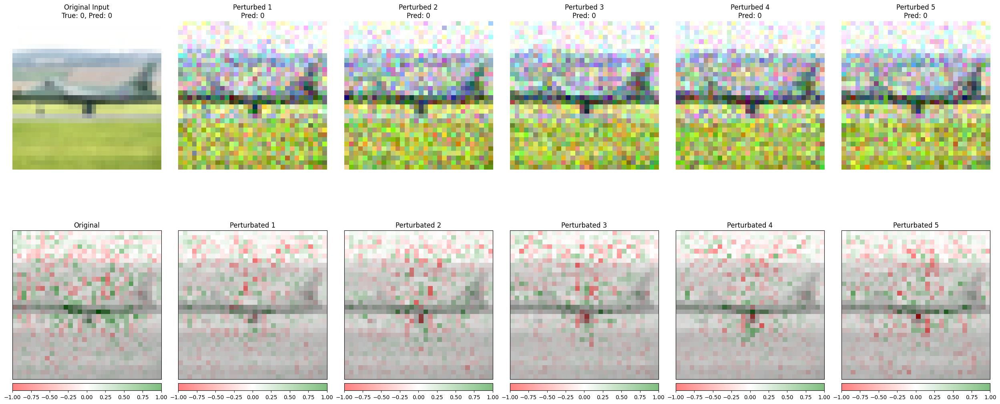





--- Processing Image 2 ---
Predicted Class: car  Probability: 0.9763669371604919
Sample 2: True Label = 1, Original Prediction = 1
Sensitivity Scores = [0.04256625, 0.055504713, 0.034382354, 0.07620572, 0.062231842]
Average Similarity: 0.0542
Perturbed Predictions: [9, 9, 9, 9, 9]


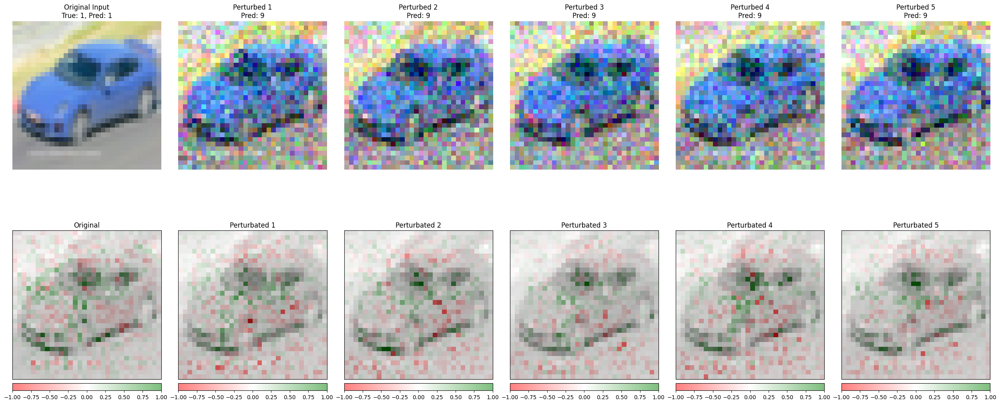





--- Processing Image 3 ---
Predicted Class: bird  Probability: 0.7278669476509094
Sample 3: True Label = 2, Original Prediction = 2
Sensitivity Scores = [0.11089898, 0.08923396, 0.07490947, 0.09054389, 0.08844656]
Average Similarity: 0.0908
Perturbed Predictions: [6, 6, 6, 6, 6]


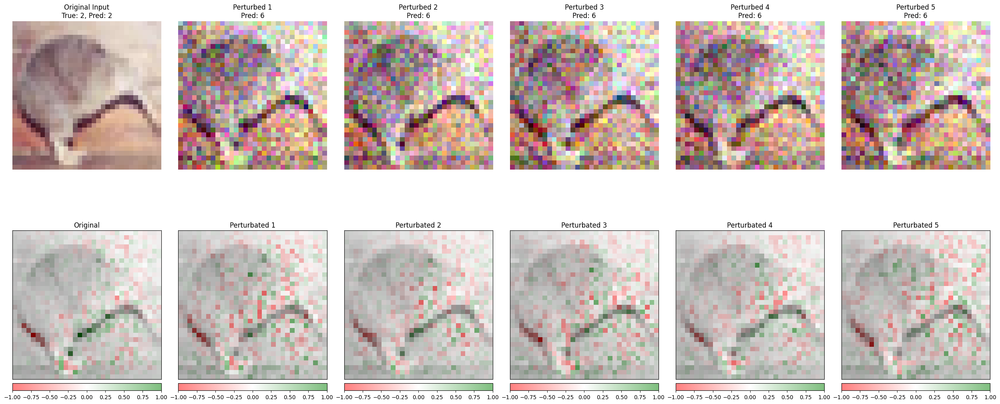





--- Processing Image 4 ---
Predicted Class: cat  Probability: 0.8935098052024841
Sample 4: True Label = 3, Original Prediction = 3
Sensitivity Scores = [0.001381782, 0.0033376317, 1.4949638e-05, 0.0046199006, 0.0015347633]
Average Similarity: 0.0022
Perturbed Predictions: [6, 6, 6, 6, 6]


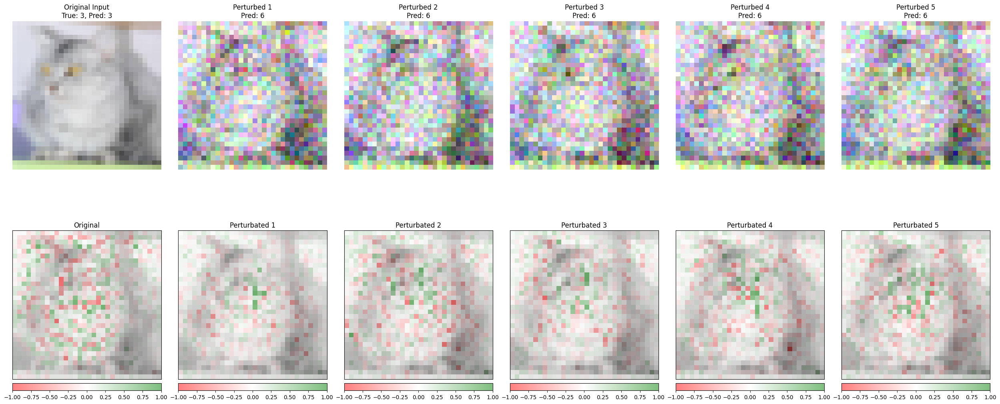





--- Processing Image 5 ---
Predicted Class: cat  Probability: 0.7540740966796875
Sample 5: True Label = 4, Original Prediction = 3
Sensitivity Scores = [0.005757261, 0.0015763184, 0.021294767, 0.0027536892, 0.011852816]
Average Similarity: 0.0086
Perturbed Predictions: [6, 6, 3, 6, 6]


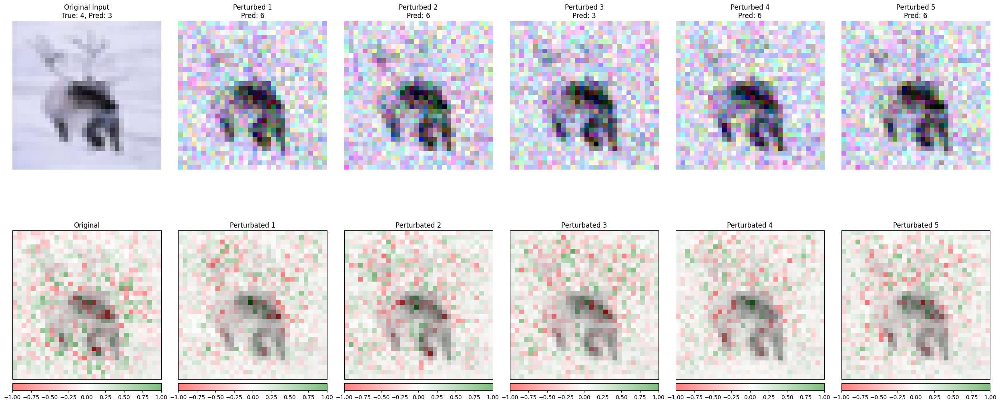





--- Processing Image 6 ---
Predicted Class: dog  Probability: 0.8975905776023865
Sample 6: True Label = 5, Original Prediction = 5
Sensitivity Scores = [0.0695127, 0.07019847, 0.0659633, 0.063179076, 0.07253785]
Average Similarity: 0.0683
Perturbed Predictions: [8, 8, 3, 8, 8]


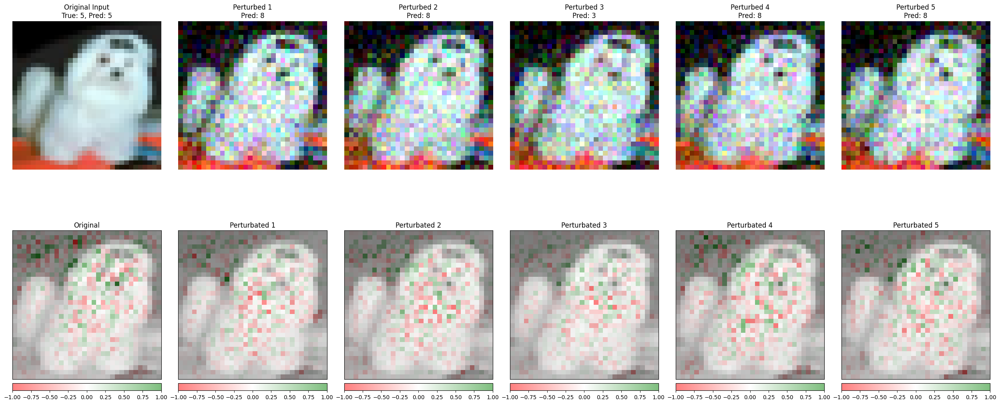





--- Processing Image 7 ---
Predicted Class: frog  Probability: 0.9912803769111633
Sample 7: True Label = 6, Original Prediction = 6
Sensitivity Scores = [0.20631574, 0.19130838, 0.17943232, 0.2113256, 0.24473901]
Average Similarity: 0.2066
Perturbed Predictions: [6, 6, 6, 6, 6]


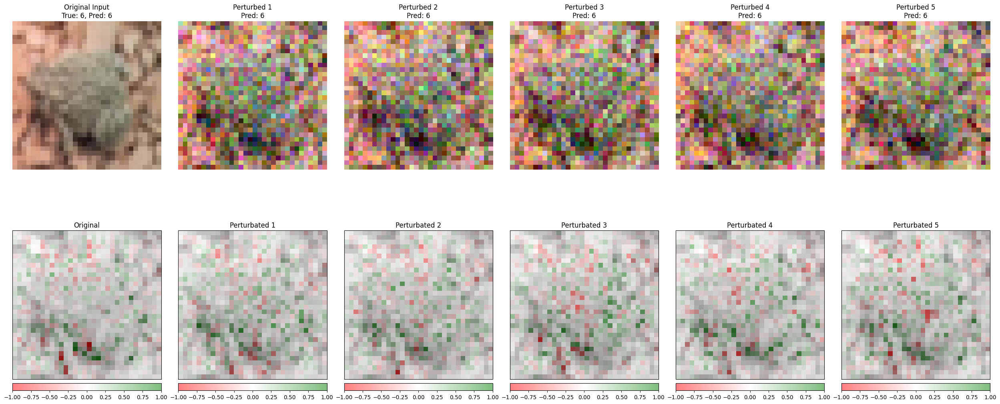





--- Processing Image 8 ---
Predicted Class: horse  Probability: 0.816964328289032
Sample 8: True Label = 7, Original Prediction = 7
Sensitivity Scores = [0.08346317, 0.06967063, 0.08730031, 0.0783172, 0.07271597]
Average Similarity: 0.0783
Perturbed Predictions: [6, 9, 9, 9, 9]


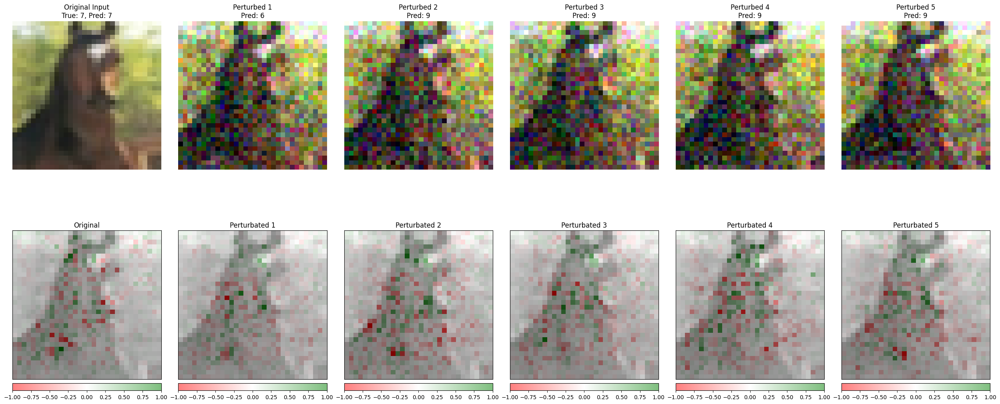





--- Processing Image 9 ---
Predicted Class: plane  Probability: 0.610080897808075
Sample 9: True Label = 8, Original Prediction = 0
Sensitivity Scores = [0.12639257, 0.076799676, 0.1035629, 0.10799279, 0.10423436]
Average Similarity: 0.1038
Perturbed Predictions: [0, 9, 0, 0, 0]


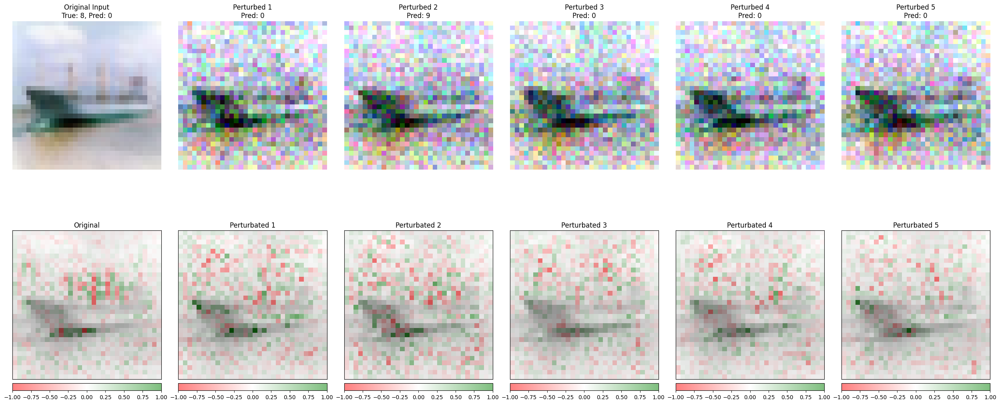





--- Processing Image 10 ---
Predicted Class: truck  Probability: 0.9992783665657043
Sample 10: True Label = 9, Original Prediction = 9
Sensitivity Scores = [0.07607407, 0.0489627, 0.055279076, 0.032496735, 0.04766369]
Average Similarity: 0.0521
Perturbed Predictions: [9, 9, 9, 9, 9]


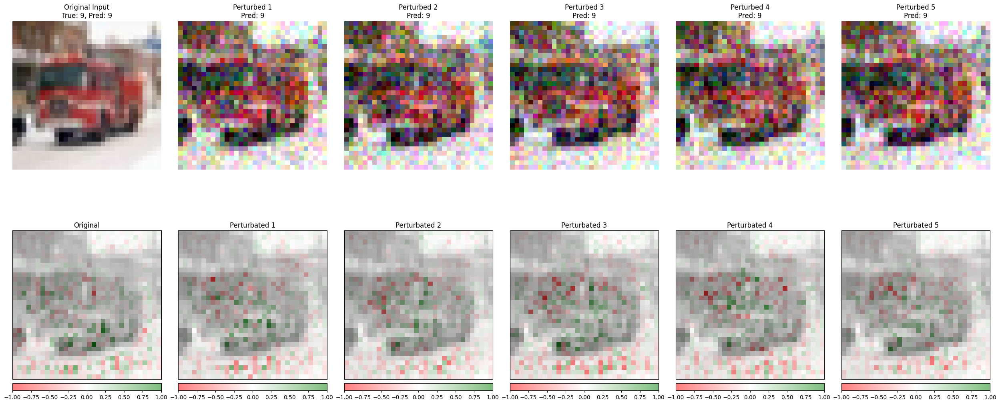

In [131]:
# Compute sensitivity scores and visualize attributions for each image
for i, image in enumerate(examples):

    sample_input = image.unsqueeze(0)

    # Define the baseline (a black image)
    baseline = torch.zeros_like(sample_input)

    # Make prediction for the current image
    model.eval() # Set model to evaluation mode
    with torch.no_grad():
        outputs = model(sample_input)
    probabilities = F.softmax(outputs, dim=1)
    predicted_prob, predicted_class_idx = torch.max(probabilities, 1)

    print(f'\n--- Processing Image {i+1} ---')
    print('Predicted Class:', classes[predicted_class_idx.item()],
          ' Probability:', predicted_prob.item())

    label = i
    predicted_label = predicted_class_idx.item()

    # Perform sensitivity analysis with high noise level

    # scegli te il livello di noise
    sensitivity_scores, original_attributions, perturbed_inputs, all_attributions, perturbed_predictions = sensitivity_analysis(
        model, sample_input, baseline, predicted_label, noise_std=0.5, num_perturbations=5
    )

    print(f"Sample {i + 1}: True Label = {label}, Original Prediction = {predicted_label}")
    print(f"Sensitivity Scores = {sensitivity_scores}")
    print(f"Average Similarity: {np.mean(sensitivity_scores):.4f}")
    print(f"Perturbed Predictions: {perturbed_predictions}")

    # Unnormalize and prepare original image for visualization
    original_image = unnormalize(image)
    original_image = original_image.detach().cpu().numpy()
    original_image = np.transpose(original_image, (1, 2, 0))


    ### Plotting images

    fig, axes = plt.subplots(2, 6, figsize=(25, 6* 2)) # 5 columns: Original + 4 Saliency Maps

    axes[0, 0].imshow(original_image)
    axes[0, 0].set_title(f"Original Input\nTrue: {label}, Pred: {predicted_label}")
    axes[0, 0].axis("off")

    for j, perturbed_input in enumerate(perturbed_inputs):
        perturbed_input = unnormalize(perturbed_input.squeeze())
        perturbed_input = perturbed_input.detach().cpu().numpy()
        perturbed_input = np.transpose(perturbed_input, (1, 2, 0))
        axes[0, j + 1].imshow(perturbed_input)
        axes[0, j + 1].set_title(f"Perturbed {j + 1}\nPred: {perturbed_predictions[j]}")
        axes[0, j + 1].axis("off")


    ### Plotting attributions

    # Plot original attributions
    # Plotting
    # fig, axes = plt.subplots(1, len(all_attributions) + 1, figsize=(15, 5))
    original_attributions = np.transpose(original_attributions.squeeze(), (1, 2, 0))
    _ = viz.visualize_image_attr(original_attributions, original_image, method="blended_heat_map",
      sign="all", show_colorbar=True,
      title="Original",
      plt_fig_axis=(fig, axes[1, 0]), use_pyplot=False)

    # Plot perturbated attributions
    for j, perturbed_attribution in enumerate(all_attributions):
        perturbed_attribution = np.transpose(perturbed_attribution.squeeze(), (1, 2, 0))
        _ = viz.visualize_image_attr(perturbed_attribution, original_image, method="blended_heat_map",
            sign="all", show_colorbar=True,
            title=f"Perturbated {j+1}",
            plt_fig_axis=(fig, axes[1, j+1]), use_pyplot=False)


    plt.tight_layout()
    plt.show()

    print("\n\n")


In [132]:
def evaluate_IG_stability(model, examples, labels, baseline_strategy='zero',
                             noise_std=0.1, num_perturbations=5):
    """
    Simple routine to evaluate explanation stability across the entire dataset.

    Args:
        model: The model to evaluate
        test_loader: DataLoader for test set
        baseline_strategy: 'zero' or 'mean' baseline
        noise_std: Standard deviation for noise perturbations
        num_perturbations: Number of perturbations per sample
        max_samples: Maximum number of samples to evaluate (None = all)

    Returns:
        Dictionary with basic stability statistics
    """
    model.eval()
    device = next(model.parameters()).device

    all_sensitivity_scores = []

    for idx in tqdm(range(len(examples)), desc="Processing examples"):
      # Get single image
      input_image = examples[idx].unsqueeze(0).to(device)  # Add batch dimension
      true_label = labels[idx]

      # Get original prediction
      with torch.no_grad():
          logits = model(input_image)[0] if isinstance(model(input_image), tuple) else model(input_image)
          original_pred_label = F.softmax(logits, dim=1).argmax(dim=1)[0].item()


      # Create baseline
      if baseline_strategy == 'zero':
          baseline = torch.zeros_like(input_image)
      elif baseline_strategy == 'mean':
          baseline = torch.full_like(input_image, input_image.mean())
      else:
          raise ValueError(f"Unknown baseline strategy: {baseline_strategy}")

      try:
          # Use your original sensitivity_analysis function
          sensitivity_scores, _, _, _, _ = sensitivity_analysis(
              model=model,
              input_image=input_image,
              baseline=baseline,
              target_class=original_pred_label,
              noise_std=noise_std,
              num_perturbations=num_perturbations
          )

          # Store all sensitivity scores from this sample
          all_sensitivity_scores.extend(sensitivity_scores)

      except Exception as e:
          print(f"Error processing sample {idx}: {e}")
          continue

    return all_sensitivity_scores

In [133]:
examples, true_labels = get_subsample()

In [134]:
# Set random seeds for reproducibility
seed = 10
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)

steps = 5
noise_levels = np.linspace(0.01, 0.1, steps)
for i in range(steps):
    noise_std = noise_levels[i]

    sensitivity_scores = evaluate_IG_stability(
      model=model,
      examples=examples,
      labels=true_labels,
      baseline_strategy='zero',
      noise_std=noise_std,
      num_perturbations=5
    )
    print(f"Noise Level: {noise_std}")
    print(f"Average Similarity: {np.mean(sensitivity_scores):.4f}")
    print(f"Standard Deviation: {np.std(sensitivity_scores):.4f}")

Processing examples: 100%|██████████| 100/100 [00:11<00:00,  8.84it/s]


Noise Level: 0.01
Average Similarity: 0.9417
Standard Deviation: 0.0484


Processing examples: 100%|██████████| 100/100 [00:10<00:00,  9.53it/s]


Noise Level: 0.0325
Average Similarity: 0.8411
Standard Deviation: 0.0772


Processing examples: 100%|██████████| 100/100 [00:10<00:00,  9.56it/s]


Noise Level: 0.05500000000000001
Average Similarity: 0.7594
Standard Deviation: 0.0891


Processing examples: 100%|██████████| 100/100 [00:10<00:00,  9.43it/s]


Noise Level: 0.0775
Average Similarity: 0.6870
Standard Deviation: 0.0959


Processing examples: 100%|██████████| 100/100 [00:10<00:00,  9.45it/s]

Noise Level: 0.1
Average Similarity: 0.6205
Standard Deviation: 0.1022
